In [1]:
!pip list
!nvidia-smi

Package                       Version
----------------------------- ------------------
absl-py                       0.12.0
aiohttp                       3.8.1
aiosignal                     1.2.0
albumentations                1.1.0
antlr4-python3-runtime        4.8
anyio                         3.4.0
appdirs                       1.4.4
argon2-cffi                   21.1.0
astunparse                    1.6.3
async-generator               1.10
async-timeout                 4.0.1
attrs                         21.2.0
audioread                     2.1.9
backcall                      0.2.0
backports.functools-lru-cache 1.6.4
beautifulsoup4                4.6.0
black                         21.12b0
bleach                        4.1.0
branca                        0.4.2
brotlipy                      0.7.0
cachetools                    4.2.4
certifi                       2021.10.8
cffi                          1.15.0
chardet                       3.0.4
charset-normalizer            2.0.8
clang 

In [2]:
!mkdir scalp_meta

In [3]:
%cd scalp_meta

/aiffel/scalp_meta


In [4]:
%pwd

'/aiffel/scalp_meta'

In [5]:
!unzip /aiffel/aiffel/scalp_practice/meta/META_DATA.zip

Archive:  /aiffel/aiffel/scalp_practice/meta/META_DATA.zip
  inflating: 0013_A2LEBJJDE00060O_1602578303771_2_TH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602578303771_3_TH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602578303771_4_LH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602578303771_5_RH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602578303771_6_BH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602911366731_2_TH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602911366731_3_TH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602911366731_4_LH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602911366731_5_RH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1602911366731_6_BH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1603096385510_2_TH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1603096385510_4_LH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1603096790519_2_TH_META.json  
  inflating: 0013_A2LEBJJDE00060O_1603096790519_3_TH_META.json  
  inflating: 0013_A2LEBJJDE0006

In [6]:
%pwd

'/aiffel/scalp_meta'

In [7]:
# 데이터 확인 및 이동

from glob import glob

json_list = glob('/aiffel/aiffel/scalp_practice/scalp_meta/*.json')
print(len(json_list))

101027


In [8]:
# json 파일 ---> DF변환
json_list[101026]

'/aiffel/aiffel/scalp_practice/scalp_meta/6825_A1LCAIHDH00018Y_1612600315091_5_RH_META.json'

In [9]:
from tqdm import tqdm
import json

In [10]:
import pandas as pd

df = pd.read_json(json_list[0], orient ='index')
cnt = 0


for i in tqdm(json_list[70001:75001]):
    df_concat = pd.read_json(i, orient ='index')
    if cnt == 0 :
        df_final = pd.concat([df, df_concat], axis=1)
    else :
        df_final = pd.concat([df_final, df_concat], axis=1)
    cnt+=1

100%|██████████| 5000/5000 [02:34<00:00, 32.30it/s]


In [11]:
# 합친 데이터프레임 역치로 바꾸기

df = df_final.T

In [12]:
# reset index로 인덱스 재정렬

df = df.reset_index()

In [13]:
# index 컬럼을 삭제

df = df.drop(['index'], axis=1)

In [14]:
# 최종 df 확인

df.head()

,gender,age,location,question1,answers1,question2,answers2,question3,answers3,question4,answers4,question5,answers5,question6,answers6,question7,answers7
0,남,30대,TH,샴푸 사용 빈도,1일 1회,펌 주기,4~6회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,트리트먼트",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
1,여,20대,TH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),4~6회/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,"샴푸,헤어에센스,트리트먼트",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
2,남,30대,LH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,헤어에센스",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
3,남,60대,BH,샴푸 사용 빈도,1일 1회,펌 주기,7회 이상/연,염색 주기 (자가 염색 포함),7회 이상/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,두피자극
4,남,40대,RH,샴푸 사용 빈도,1일 1회,펌 주기,4~6회/연,염색 주기 (자가 염색 포함),4~6회/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,"샴푸,헤어에센스,린스,트리트먼트",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,머리결


In [15]:
%cd /aiffel/aiffel/scalp_practice/

/aiffel/aiffel/scalp_practice


In [16]:
df.to_csv("meta_data_json_75000.csv",encoding = 'utf-8')

In [17]:
file_names = glob("/aiffel/aiffel/scalp_practice/*.csv")
file_names

['/aiffel/aiffel/scalp_practice/total.csv',
 '/aiffel/aiffel/scalp_practice/meta_data_json_75000.csv',
 '/aiffel/aiffel/scalp_practice/두피.csv']

In [18]:
import pandas as pd
from glob import glob

file_names = glob("/aiffel/aiffel/scalp_practice/*.csv") #폴더 내의 모든 csv파일 목록을 불러온다
total = pd.DataFrame() #빈 데이터프레임 하나를 생성한다

for file_name in file_names:
    temp = pd.read_csv(file_name, sep=',', encoding='utf-8') #csv파일을 하나씩 열어 임시 데이터프레임으로 생성한다
    total = pd.concat([total, temp]) #전체 데이터프레임에 추가하여 넣는다

total.to_csv("/aiffel/aiffel/scalp_practice/*.csv")

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xc3 in position 18: invalid continuation byte

In [19]:
# 나눔폰트 설치
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
fonts-nanum is already the newest version (20180306-3).
The following packages were automatically installed and are no longer required:
  accountsservice-ubuntu-schemas bc bluez-obexd cups cups-browsed cups-client
  cups-common cups-core-drivers cups-daemon cups-filters
  cups-filters-core-drivers cups-ipp-utils cups-ppdc cups-server-common
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript
  gir1.2-dbusmenu-glib-0.4 gnome-bluetooth gnome-power-manager
  gnome-screensaver gsettings-ubuntu-schemas gvfs-backends indicator-applet
  indicator-application indicator-appmenu indicator-bluetooth indicator-common
  indicator-datetime indicator-keyboard indicator-messages indicator-power
  indicator-printers indicator-session indicator-sound jayatana
  libaccounts-glib0 libbamf3-2 libcdio-cdda2 libcdio-paranoia2 libcdio18
  libcupsfilters1 libfcitx-config4 libfcitx-gclient1 libfcitx-u

In [20]:
import matplotlib.pyplot as plt

plt.rc('font', family='NanumBarunGothic')

In [21]:
import pandas as pd


tdf = pd.read_csv('/aiffel/aiffel/scalp_practice/total.csv', encoding = 'UTF-8')
tdf.tail()

,Unnamed: 0,Unnamed: 0.1,gender,age,location,question1,answers1,question2,answers2,question3,answers3,question4,answers4,question5,answers5,question6,answers6,question7,answers7,Unnamed: 0.1.1
100015,4996,4996,남,20대,RH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,아니오,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력,NaN
100016,4997,4997,여,30대,TH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,헤어에센스,트리트먼트",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,두피자극,NaN
100017,4998,4998,여,20대,TH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,트리트먼트",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,향,NaN
100018,4999,4999,남,30대,LH,샴푸 사용 빈도,1일 1회,펌 주기,하지않음,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,모발이식/시술,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,두피자극,NaN
100019,5000,5000,여,40대,TH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),7회 이상/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,"트리트먼트,샴푸",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,헹굼후느낌,NaN


In [22]:
tdf.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'gender', 'age', 'location', 'question1',
       'answers1', 'question2', 'answers2', 'question3', 'answers3',
       'question4', 'answers4', 'question5', 'answers5', 'question6',
       'answers6', 'question7', 'answers7', 'Unnamed: 0.1.1'],
      dtype='object')

In [23]:
tdf = tdf.drop(columns = ['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1'])

In [24]:
tdf.head(5)

,gender,age,location,question1,answers1,question2,answers2,question3,answers3,question4,answers4,question5,answers5,question6,answers6,question7,answers7
0,남,50대,TH,샴푸 사용 빈도,1일 2회,펌 주기,하지않음,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
1,여,60대,TH,샴푸 사용 빈도,1일 1회,펌 주기,4~6회/연,염색 주기 (자가 염색 포함),4~6회/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
2,남,0대,BH,샴푸 사용 빈도,1일 1회,펌 주기,하지않음,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
3,여,50대,RH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),4~6회/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,"샴푸,헤어에센스,린스",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
4,남,20대,LH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,트리트먼트,두피 세럼",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,두피자극


In [25]:
tdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100020 entries, 0 to 100019
Data columns (total 17 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   gender     100020 non-null  object
 1   age        100020 non-null  object
 2   location   100020 non-null  object
 3   question1  100020 non-null  object
 4   answers1   100014 non-null  object
 5   question2  100020 non-null  object
 6   answers2   100020 non-null  object
 7   question3  100020 non-null  object
 8   answers3   100020 non-null  object
 9   question4  100020 non-null  object
 10  answers4   100020 non-null  object
 11  question5  100020 non-null  object
 12  answers5   100020 non-null  object
 13  question6  100020 non-null  object
 14  answers6   99990 non-null   object
 15  question7  100020 non-null  object
 16  answers7   100020 non-null  object
dtypes: object(17)
memory usage: 13.0+ MB


In [26]:
tdf.isnull().sum()

gender        0
age           0
location      0
question1     0
answers1      6
question2     0
answers2      0
question3     0
answers3      0
question4     0
answers4      0
question5     0
answers5      0
question6     0
answers6     30
question7     0
answers7      0
dtype: int64

In [27]:
tdf['answers1'].value_counts(dropna=True).idxmax()  # 1일 1회

'1일 1회'

In [28]:
tdf['answers1'].fillna(tdf['answers1'].value_counts(dropna=True).idxmax(), inplace = True)

In [29]:
tdf['answers1'].isnull().sum()

0

In [30]:
tdf.isnull().sum()

gender        0
age           0
location      0
question1     0
answers1      0
question2     0
answers2      0
question3     0
answers3      0
question4     0
answers4      0
question5     0
answers5      0
question6     0
answers6     30
question7     0
answers7      0
dtype: int64

<AxesSubplot:>

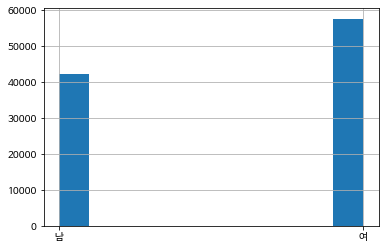

In [31]:
tdf['gender'].hist()

<AxesSubplot:>

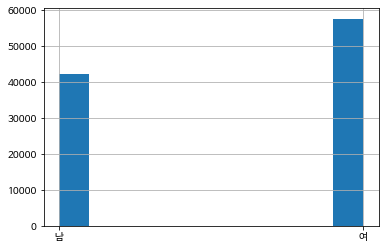

In [32]:
tdf['gender'].hist()

In [33]:
# EDA
tdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100020 entries, 0 to 100019
Data columns (total 17 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   gender     100020 non-null  object
 1   age        100020 non-null  object
 2   location   100020 non-null  object
 3   question1  100020 non-null  object
 4   answers1   100020 non-null  object
 5   question2  100020 non-null  object
 6   answers2   100020 non-null  object
 7   question3  100020 non-null  object
 8   answers3   100020 non-null  object
 9   question4  100020 non-null  object
 10  answers4   100020 non-null  object
 11  question5  100020 non-null  object
 12  answers5   100020 non-null  object
 13  question6  100020 non-null  object
 14  answers6   99990 non-null   object
 15  question7  100020 non-null  object
 16  answers7   100020 non-null  object
dtypes: object(17)
memory usage: 13.0+ MB


In [34]:
!pwd

/aiffel/aiffel/scalp_practice


In [35]:
!pip install openpyxl

In [36]:
#  현재 사용하고 있는 두피모발용제품 겹치는 컬럼 바꾼 데이터
import pandas as pd
scalp = pd.read_excel('/aiffel/aiffel/scalp_practice/hair.xlsx')
scalp.tail()

,gender,age,location,question1,answers1,question2,answers2,question3,answers3,question4,answers4,question5,answers5,question6,answers6,question7,answers7
100015,남,20대,RH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,아니오,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
100016,여,30대,TH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,트리트먼트,헤어에센스",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,두피자극
100017,여,20대,TH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,트리트먼트",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,향
100018,남,30대,LH,샴푸 사용 빈도,1일 1회,펌 주기,하지않음,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,모발이식/시술,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,두피자극
100019,여,40대,TH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),7회 이상/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,"트리트먼트,샴푸",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,헹굼후느낌


In [37]:
scalp['gender'].value_counts()

여    57658
남    42362
Name: gender, dtype: int64

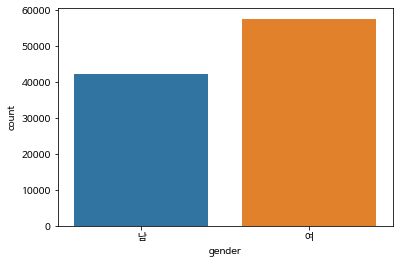

In [38]:
import seaborn as sns
test = sns.countplot(x = 'gender', data = scalp)

In [39]:
scalp['age'].value_counts()

20대     27164
30대     23884
40대     18670
50대     15471
60대      7542
10대      4518
70대      1619
0대        744
80대       369
90대        28
110대       11
Name: age, dtype: int64

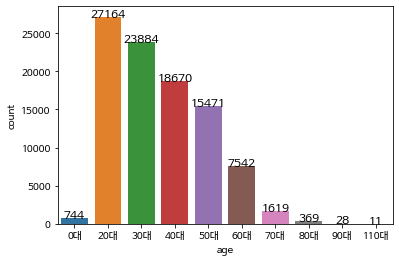

In [40]:
ax = sns.countplot(x = 'age', data = scalp, order = ['0대','20대','30대','40대','50대', '60대','70대','80대','90대','110대'])

import matplotlib.pyplot as plt
for p in ax.patches:
  height = p.get_height()
  ax.text(p.get_x() + p.get_width()/2. ,height + 3, height, ha='center',size=12)
#ax.set_ylim(-5,100)
plt.show()

In [41]:
scalp['location'].value_counts()

TH    39131
RH    20652
LH    20351
BH    19886
Name: location, dtype: int64

<AxesSubplot:xlabel='location', ylabel='count'>

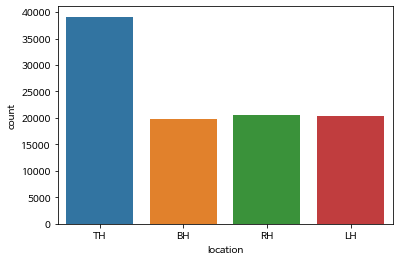

In [42]:
sns.countplot(x = 'location', data = scalp)

In [43]:
scalp['answers1'].value_counts()

1일 1회    73868
1일 2회    16988
2일 1회     9164
Name: answers1, dtype: int64

<AxesSubplot:xlabel='answers1', ylabel='count'>

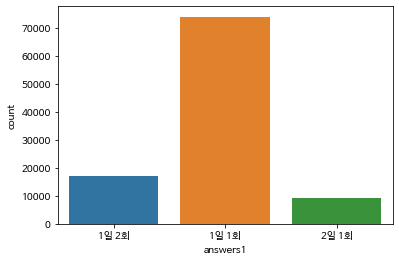

In [44]:
sns.countplot(x = 'answers1', data = scalp)

<AxesSubplot:xlabel='answers1', ylabel='count'>

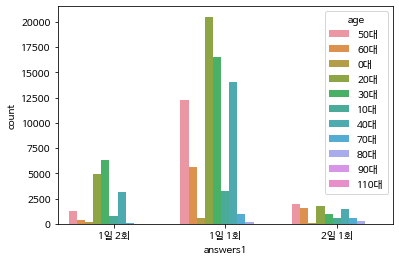

In [45]:
sns.countplot(x = 'answers1', data = scalp, hue = 'age')

In [46]:
scalp['answers2'].value_counts()

하지않음       50282
1~3회/연     34993
4~6회/연     12040
7회 이상/연     2705
Name: answers2, dtype: int64

<AxesSubplot:xlabel='answers2', ylabel='count'>

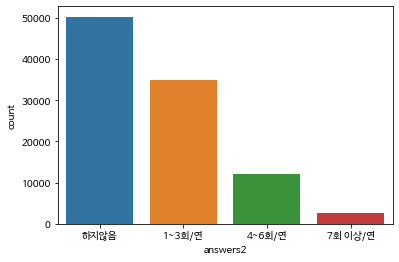

In [47]:
sns.countplot(x = 'answers2', data = scalp, order = ['하지않음','1~3회/연', '4~6회/연','7회 이상/연'])

In [48]:
scalp['answers3'].value_counts()

하지않음       41644
1~3회/연     21770
7회 이상/연    18916
4~6회/연     17690
Name: answers3, dtype: int64

<AxesSubplot:xlabel='answers3', ylabel='count'>

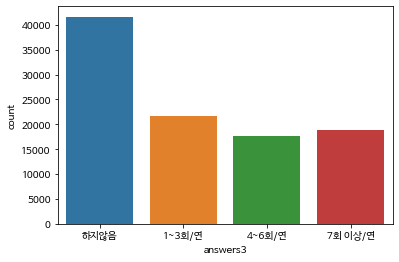

In [49]:
sns.countplot(x = 'answers3', data = scalp, order = ['하지않음','1~3회/연', '4~6회/연','7회 이상/연'])

In [50]:
scalp['answers4'].value_counts()

염색 모발                              53637
기타                                 40664
염색 모발,기타                            3530
가발 사용(붙임머리 포함)                       527
모발이식/시술                              365
염색 모발,가발 사용(붙임머리 포함)                 355
기타,염색 모발                             321
가발 사용(붙임머리 포함),염색 모발                 205
염색 모발,모발이식/시술                        125
모발이식/시술,염색 모발                         56
기타,모발이식/시술                            41
가발 사용(붙임머리 포함),기타                     36
모발이식/시술,기타                            29
가발 사용(붙임머리 포함),모발이식/시술                15
,염색 모발                                13
염색 모발,기타,모발이식/시술,가발 사용(붙임머리 포함)       13
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발       13
염색 모발,기타,가발 사용(붙임머리 포함),모발이식/시술       12
,기타                                   12
모발이식/시술,가발 사용(붙임머리 포함)                 9
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발        6
모발이식/시술,가발 사용(붙임머리 포함),염색 모발,기타        6
기타,염색 모발,가발 사용(붙임머리 포함),모발이식/시술        6
기타,가발 사용(붙임머리 포함)                      6
염색 모발,모발이식/시술,기타

<AxesSubplot:xlabel='answers4', ylabel='count'>

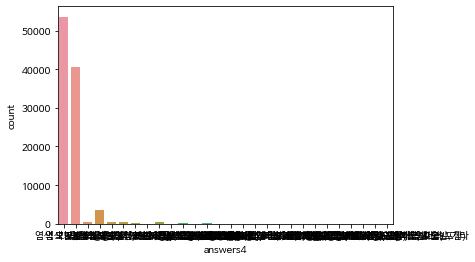

In [51]:
sns.countplot(x = 'answers4', data = scalp)

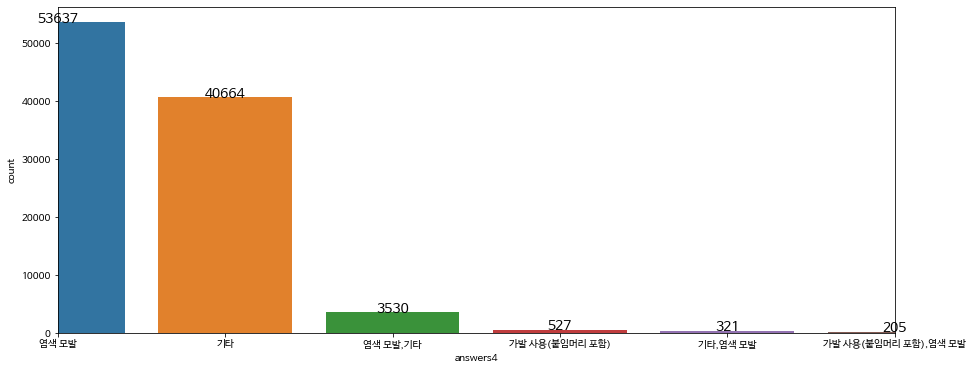

In [52]:
# 막대그래프
fig = plt.figure(figsize=(15,6))
ax = sns.countplot(x = 'answers4', data = scalp, order = ['염색 모발','기타','염색 모발,기타','가발 사용(붙임머리 포함)','기타,염색 모발','가발 사용(붙임머리 포함),염색 모발'])
plt.xlim([0, 5])

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 30, height, ha = 'center', size = 14)

plt.show()

([<matplotlib.patches.Wedge at 0x7f746567f3d0>,
 [Text(-1.0888675961816296, -0.15610047400837687, '염색 모발'),
  Text(1.0999097772187483, 0.014088363233670569, '기타'),
  Text(0.16048158693704928, 1.0882305179759324, '염색 모발,기타'),
  Text(0.018515167686764703, 1.0998441655823479, '가발 사용(붙임머리 포함)')],
 [Text(-0.5939277797354342, -0.08514571309547828, '54.5%'),
  Text(0.5999507875738626, 0.007684561763820309, '41.3%'),
  Text(0.08753541105657232, 0.5935802825323268, '3.6%'),
  Text(0.010099182374598928, 0.5999149994085533, '0.5%')])

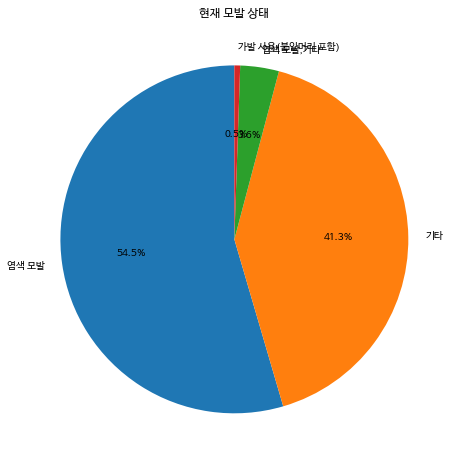

In [53]:
# 파이차트
# import matplotlib.pyplot as plt
# colors = ['#ff9999', '#ffc000', '#8fd9b6', '#d395d0']
# wedgeprops={'width': 0.7, 'edgecolor': 'w', 'linewidth': 5}

# plt.pie(x = 'answers4', data = tdf, autopct='%.1f%%', startangle=260, counterclock=False, colors=colors, wedgeprops=wedgeprops)
# plt.show()
fig = plt.figure(figsize=(20,8))
import matplotlib.pyplot as plt
name = ['염색 모발','기타','염색 모발,기타','가발 사용(붙임머리 포함)']
plt.title('현재 모발 상태')
plt.pie(x = tdf['answers4'].value_counts()[:4], data = tdf,labels = name, startangle=90, autopct='%.1f%%')

In [54]:
scalp['answers5'].value_counts()[:44]

샴푸                                  34365
샴푸,트리트먼트                            14140
샴푸,트리트먼트,헤어에센스                      13594
샴푸,린스                                8120
샴푸,헤어에센스                             3979
샴푸,린스,헤어에센스                          3086
샴푸,린스,트리트먼트                          2243
샴푸,헤어 스타일링제                          1749
샴푸,트리트먼트,헤어에센스,헤어 스타일링제              1663
샴푸,린스,헤어에센스,트리트먼트                    1536
샴푸,두피 세럼                             1503
샴푸,트리트먼트,헤어 스타일링제                    1058
샴푸,헤어에센스,두피 세럼,트리트먼트                  755
샴푸,린스,트리트먼트,헤어에센스                     671
헤어에센스                                 493
샴푸,트리트먼트,헤어에센스,린스                     485
트리트먼트,샴푸                              443
샴푸,두피 세럼,트리트먼트                        403
샴푸,린스,헤어 스타일링제                        396
샴푸,헤어에센스,헤어 스타일링제                     352
샴푸,트리트먼트,두피 세럼                        350
두피 세럼                                 326
샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제            323
샴푸,헤어에센스,두피 세럼                    

In [55]:
from collections import Counter

tmp_list = []
lst = []
for care in scalp['answers5']:
    # care.split(',')
    tmp_list.append(care)

new = set(tmp_list)
h = list(new)
for i in h :
    lst.append(i.split(','))

set_lst = set()

for i in lst :
    for j in i :
        set_lst.add(j)

set_lst
# 샴푸, 린스, 헤어에센스, 트리트먼트, 두피 세럼, 두피 스케일링제, 헤어 스타일링제 -> 7개
# lst.append(i)

{'두피 세럼', '두피 스케일링제', '린스', '샴푸', '트리트먼트', '헤어 스타일링제', '헤어에센스'}

In [56]:
shampoo = []
cnt = 0
for i in scalp['answers5'] :
    tmp = i.split(',')
    shampoo.append(tmp)

for i in shampoo :
    if '헤어에센스' in i :
        cnt += 1

cnt

# 샴푸 : 98402
# 트리트먼트 : 42708
# 헤어에센스 : 32334
# 린스 : 19549
# 헤어 스타일링제 : 8185
# 두피 세럼 : 6976
# 두피 스케일링제 : 2036

32334

<AxesSubplot:xlabel='answers5', ylabel='count'>

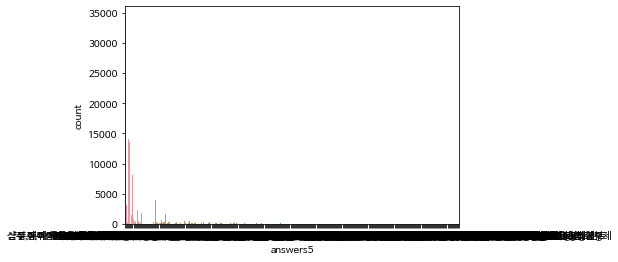

In [57]:
sns.countplot(x = 'answers5', data = scalp)

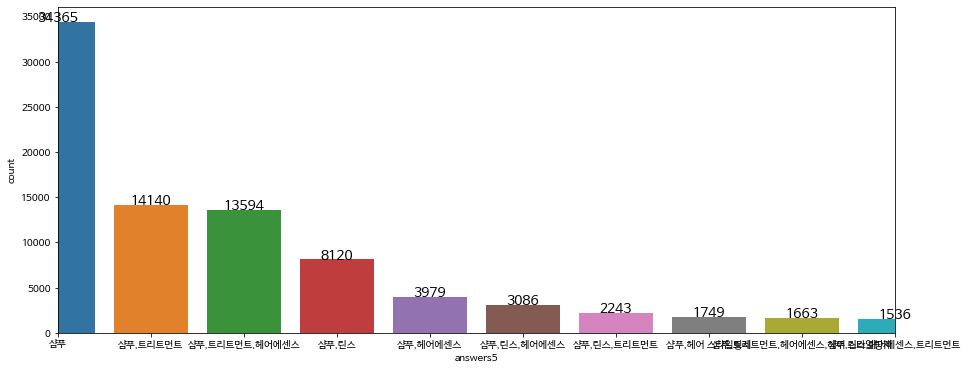

In [58]:
# 막대그래프
fig = plt.figure(figsize=(15,6))
ax = sns.countplot(x = 'answers5', data = scalp, order = ['샴푸','샴푸,트리트먼트','샴푸,트리트먼트,헤어에센스','샴푸,린스','샴푸,헤어에센스','샴푸,린스,헤어에센스','샴푸,린스,트리트먼트','샴푸,헤어 스타일링제','샴푸,트리트먼트,헤어에센스,헤어 스타일링제','샴푸,린스,헤어에센스,트리트먼트'])
plt.xlim([0, 9])

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 30, height, ha = 'center', size = 14)

plt.show()

In [59]:
scalp['answers6'].value_counts()

예      84900
아니오    15120
Name: answers6, dtype: int64

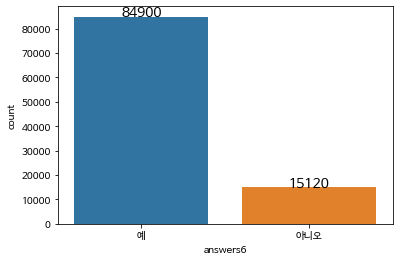

In [60]:
ax = sns.countplot(x = 'answers6', data = scalp)

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 30, height, ha = 'center', size = 14)

plt.show()

In [61]:
print('{:.2f}%의 사용자가 두피 서비스를 희망함'.format(tdf['answers6'].value_counts()[0]/tdf['answers6'].value_counts().sum()*100))

84.88%의 사용자가 두피 서비스를 희망함


In [62]:
scalp['answers7'].value_counts()

세정력      35253
두피자극     23112
머리결      22898
향        10177
헹굼후느낌     6839
가격        1741
Name: answers7, dtype: int64

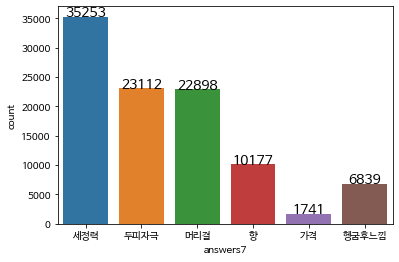

In [63]:
ax = sns.countplot(x = 'answers7', data = scalp)

for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 30, height, ha = 'center', size = 14)

plt.show()

([<matplotlib.patches.Wedge at 0x7f743d2012e0>,
 [Text(-1.0888675961816296, -0.15610047400837687, '염색 모발'),
  Text(1.0999097772187483, 0.014088363233670569, '기타'),
  Text(0.16048158693704928, 1.0882305179759324, '염색 모발,기타'),
  Text(0.018515167686764703, 1.0998441655823479, '가발 사용(붙임머리 포함)')],
 [Text(-0.5939277797354342, -0.08514571309547828, '54.5%'),
  Text(0.5999507875738626, 0.007684561763820309, '41.3%'),
  Text(0.08753541105657232, 0.5935802825323268, '3.6%'),
  Text(0.010099182374598928, 0.5999149994085533, '0.5%')])

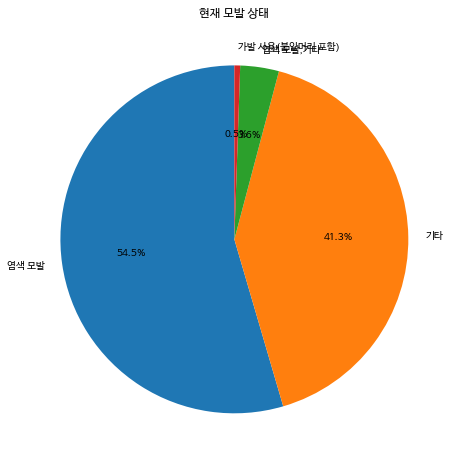

In [64]:
fig = plt.figure(figsize=(20,8))
import matplotlib.pyplot as plt
name = ['염색 모발','기타','염색 모발,기타','가발 사용(붙임머리 포함)']
plt.title('현재 모발 상태')
plt.pie(x = tdf['answers4'].value_counts()[:4], data = tdf,labels = name, startangle=90, autopct='%.1f%%')

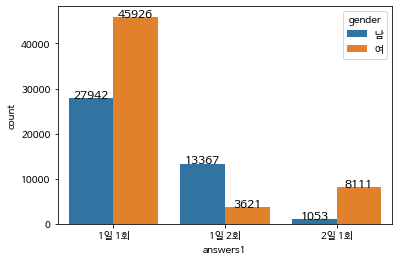

In [65]:
#성별과 샴푸주기 관계
#1일 1회에서는 여성이 남성보다 1.6배가량 높은 응답률을 보였고, 1일 2회에서는 남성이 여성의 약 4배 높은 응답률을 보였으며,
#2일 1회에서는 여성이 남성의 약 8배의 응답률을 보였다.
ax = sns.countplot(x='answers1', data=tdf, hue='gender',order = tdf['answers1'].value_counts().index)

for p in ax.patches:
  height = p.get_height()
  ax.text(p.get_x() + p.get_width()/2. ,height + 3, height, ha='center',size=12)
#ax.set_ylim(-5,100)
plt.show()

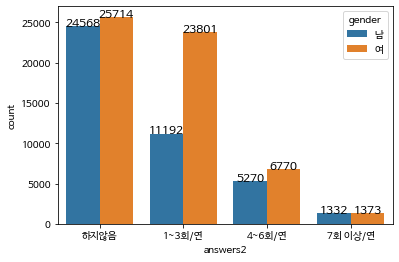

In [66]:
#성별과 펌주기 관계
#남녀 모두 하지않음 에서 가장 높은 응답률을 보였고, 1~3회/연 은 여성의 남성의 약 2배 높은 응답률을 보였으며
#4~6회/연 에서는 여성이 남성의 약 1.2배, 7회 이상/연에서는 비슷한 응답률을 볼 수 있었다.

ax = sns.countplot(x='answers2', data=tdf, hue='gender',order = tdf['answers2'].value_counts().index)

for p in ax.patches:
  height = p.get_height()
  ax.text(p.get_x() + p.get_width()/2. ,height + 3, height, ha='center',size=12)
#ax.set_ylim(-5,100)
plt.show()

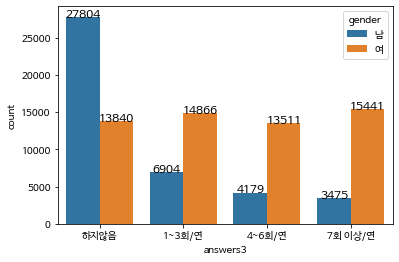

In [67]:
#성별과 염색주기 관계
#하지않음 에서 남성이 여성의 약 2배가량 높은 응답률을 보였으며 여성은 횟수의 증감에 비교적 비슷한 응답률을 보였고
#남성의 경우 염색 횟수가 늘어날수록 응답률이 낮아졌다.
ax = sns.countplot(x='answers3', data=tdf, hue='gender',order = ['하지않음','1~3회/연','4~6회/연','7회 이상/연'])

for p in ax.patches:
  height = p.get_height()
  ax.text(p.get_x() + p.get_width()/2. ,height + 3, height, ha='center',size=12)
#ax.set_ylim(-5,100)
plt.show()

TypeError: The x variable is categorical, but one of ['numeric', 'datetime'] is required

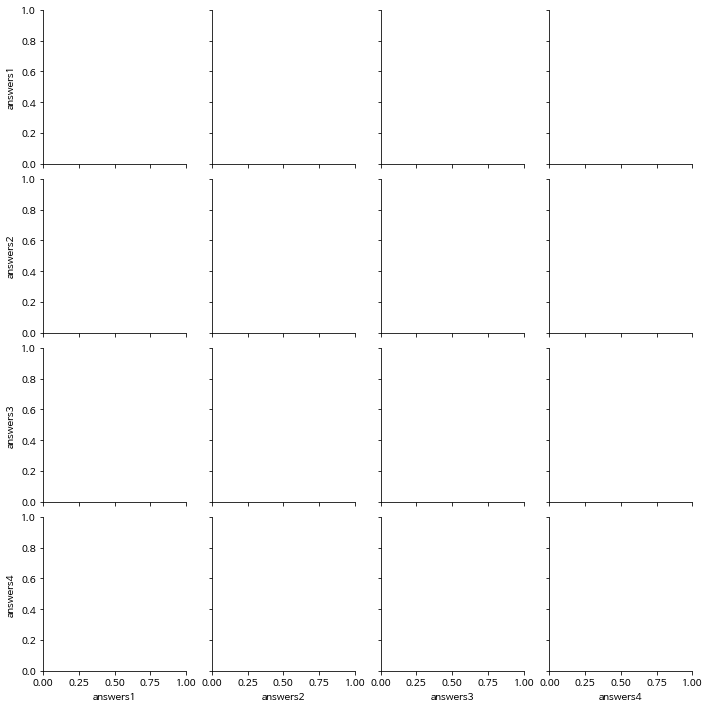

In [68]:
#pairplot은 수치형 자료 필요
#error :The x variable is categorical, but one of ['numeric', 'datetime'] is required

sns.pairplot(tdf, x_vars=['answers1', 'answers2', 'answers3', 'answers4'],
             y_vars=['answers1', 'answers2', 'answers3', 'answers4'], hue='gender')

In [69]:
# 성별에 따른 답변
scalp['gender'].value_counts()

여    57658
남    42362
Name: gender, dtype: int64

<AxesSubplot:xlabel='answers1', ylabel='count'>

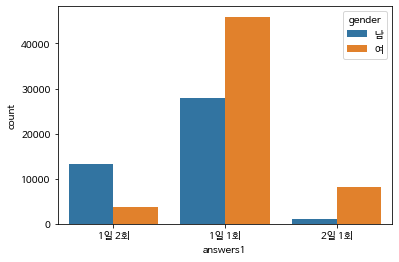

In [70]:
sns.countplot(x = 'answers1', data = scalp, hue = 'gender')

In [71]:
scalp['answers1'].groupby(scalp['gender']).value_counts()/len(scalp['answers1'])

gender  answers1
남       1일 1회       0.279364
        1일 2회       0.133643
        2일 1회       0.010528
여       1일 1회       0.459168
        2일 1회       0.081094
        1일 2회       0.036203
Name: answers1, dtype: float64

<AxesSubplot:xlabel='answers1', ylabel='count'>

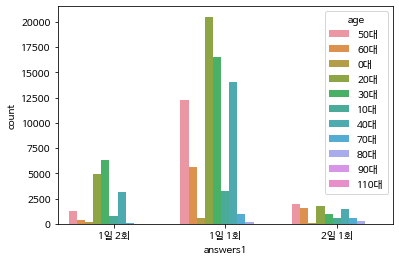

In [72]:
sns.countplot(x = 'answers1', data = scalp, hue = 'age')

In [73]:
# DataFrame 카이제곱 검정

In [74]:
import numpy as np
from scipy.linalg import *
from scipy.stats import *
import scipy

패스
age      0대   10대  110대    20대    30대    40대   50대   60대   70대  80대  90대
gender                                                                  
남       342  2122     0  10310  13275   8333  5574  1882   369  141   14
여       402  2396    11  16854  10609  10337  9897  5660  1250  228   14
1. 카이제곱 통계량: 3463.830285323112
2. p-value 0.0
3, df 10
4. 기대값 행렬:
           0            1         2             3             4   \
0  315.110258  1913.532454  4.658888  11504.912697  10115.716937   
1  428.889742  2604.467546  6.341112  15659.087303  13768.283063   

             5            6            7           8           9          10  
0   7907.403919  6552.514517  3194.303179  685.703639  156.284523  11.858988  
1  10762.596081  8918.485483  4347.696821  933.296361  212.715477  16.141012  


<Figure size 1080x432 with 0 Axes>

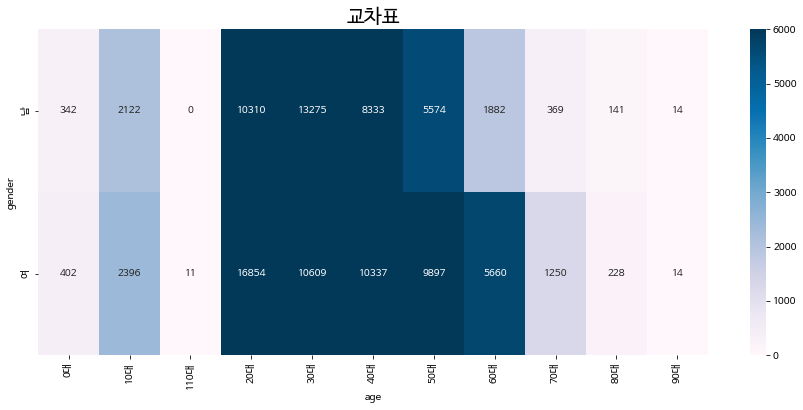

answers1  1일 1회  1일 2회  2일 1회
gender                       
남         27942  13367   1053
여         45926   3621   8111
1. 카이제곱 통계량: 13379.364467196521
2. p-value 0.0
3, df 2
4. 기대값 행렬:
              0            1            2
0  31285.705019  7195.017556  3881.277425
1  42582.294981  9792.982444  5282.722575


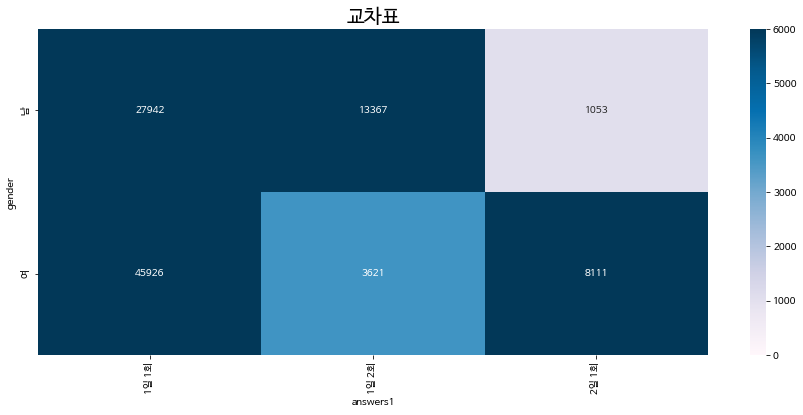

answers2  1~3회/연  4~6회/연  7회 이상/연   하지않음
gender                                  
남          11192    5270     1332  24568
여          23801    6770     1373  25714
1. 카이제곱 통계량: 2475.7004110347816
2. p-value 0.0
3, df 3
4. 기대값 행렬:
              0            1            2           3
0  14820.770506  5099.364927  1145.662967  21296.2016
1  20172.229494  6940.635073  1559.337033  28985.7984


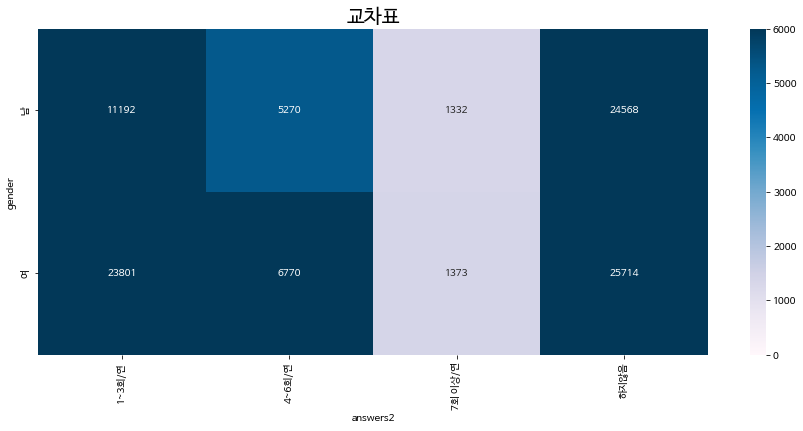

answers3  1~3회/연  4~6회/연  7회 이상/연   하지않음
gender                                  
남           6904    4179     3475  27804
여          14866   13511    15441  13840
1. 카이제곱 통계량: 18172.58410541364
2. p-value 0.0
3, df 3
4. 기대값 행렬:
              0             1             2             3
0   9220.363327   7492.339332   8011.593601  17637.703739
1  12549.636673  10197.660668  10904.406399  24006.296261


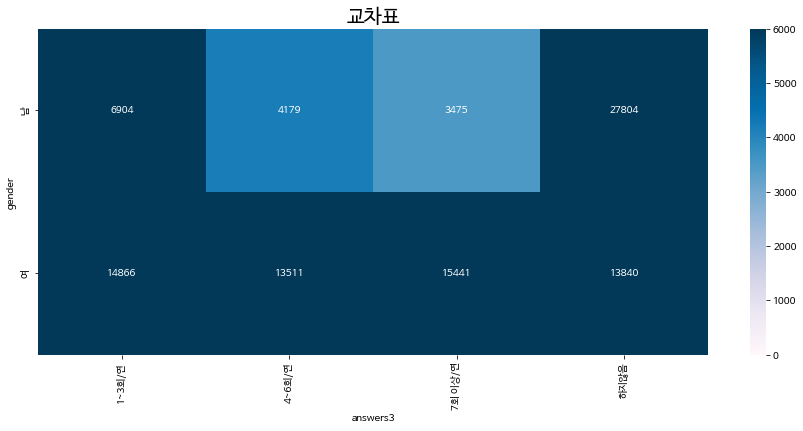

answers4  ,기타  ,염색 모발  가발 사용(붙임머리 포함)  가발 사용(붙임머리 포함),기타  \
gender                                                     
남           0       0             160                  4   
여          12      13             367                 32   

answers4  가발 사용(붙임머리 포함),모발이식/시술  가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발  \
gender                                                              
남                              0                                0   
여                             15                                6   

answers4  가발 사용(붙임머리 포함),염색 모발  가발 사용(붙임머리 포함),염색 모발,기타     기타  \
gender                                                           
남                           26                        0  27952   
여                          179                        5  12712   

answers4  기타,가발 사용(붙임머리 포함)  ...  모발이식/시술,기타  모발이식/시술,염색 모발  염색 모발  \
gender                       ...                                     
남                         6  ...          23             21  12979   
여      

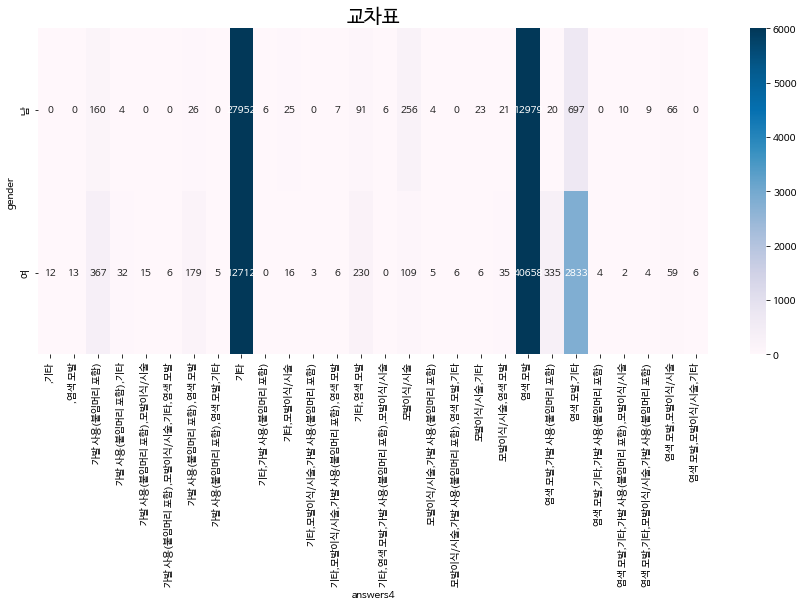

answers5  두피 세럼  두피 세럼,두피 스케일링제,샴푸  두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트  \
gender                                                                          
남           117                  9                                          0   
여           209                  0                                          2   

answers5  두피 세럼,린스  두피 세럼,린스,두피 스케일링제  두피 세럼,샴푸  \
gender                                            
남                0                  0        54   
여               11                  4        51   

answers5  두피 세럼,샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제  두피 세럼,샴푸,트리트먼트  \
gender                                                                
남                                                 0               0   
여                                                 9               6   

answers5  두피 세럼,샴푸,트리트먼트,헤어 스타일링제  두피 세럼,샴푸,트리트먼트,헤어에센스  ...  \
gender                                                   ...   
남                               0                     7  

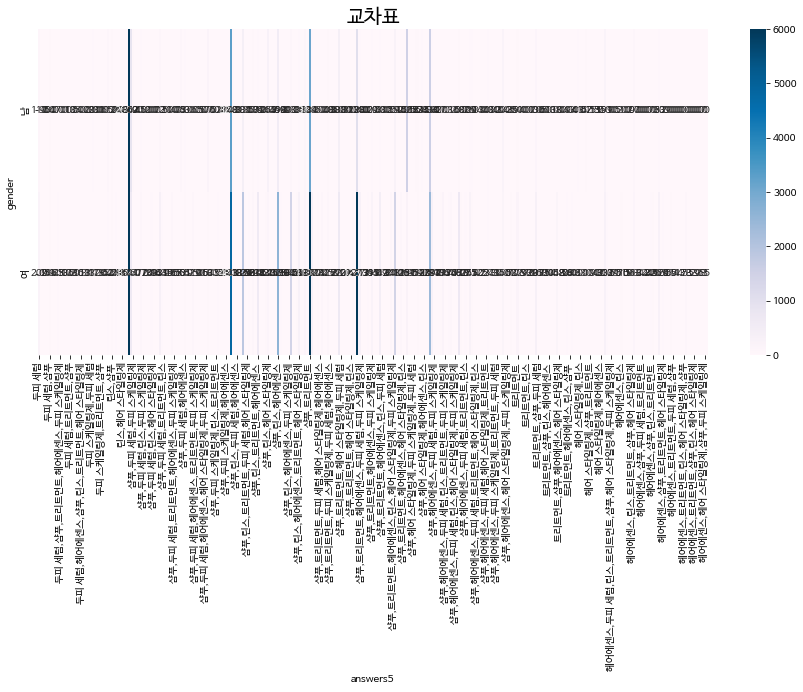

answers6   아니오      예
gender               
남         8150  34212
여         6970  50688
1. 카이제곱 통계량: 973.0302248454982
2. p-value 1.3079857645677223e-213
3, df 1
4. 기대값 행렬:
             0             1
0  6403.853629  35958.146371
1  8716.146371  48941.853629


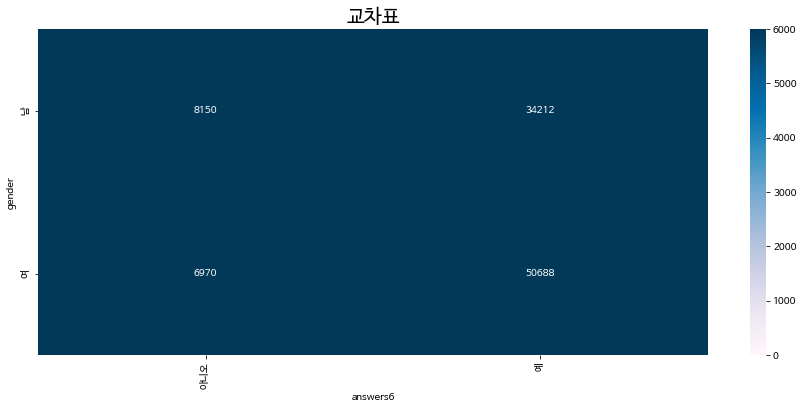

answers7    가격   두피자극    머리결    세정력     향  헹굼후느낌
gender                                          
남         1250  10447   5520  17507  4296   3342
여          491  12665  17378  17746  5881   3497
1. 카이제곱 통계량: 4707.424774537678
2. p-value 0.0
3, df 5
4. 기대값 행렬:
             0            1             2             3            4  \
0   737.374945   9788.74769   9698.111138  14930.889682  4310.318676   
1  1003.625055  13323.25231  13199.888862  20322.110318  5866.681324   

             5  
0  2896.557868  
1  3942.442132  


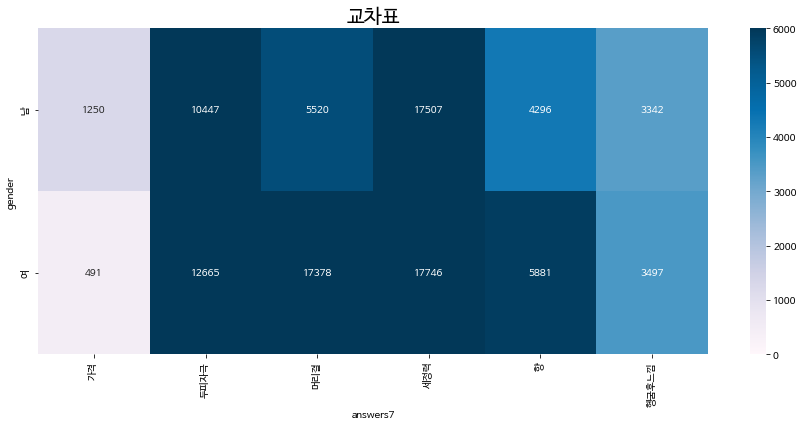

gender      남      여
age                 
0대        342    402
10대      2122   2396
110대        0     11
20대     10310  16854
30대     13275  10609
40대      8333  10337
50대      5574   9897
60대      1882   5660
70대       369   1250
80대       141    228
90대        14     14
1. 카이제곱 통계량: 3463.830285323112
2. p-value 0.0
3, df 10
4. 기대값 행렬:
               0             1
0     315.110258    428.889742
1    1913.532454   2604.467546
2       4.658888      6.341112
3   11504.912697  15659.087303
4   10115.716937  13768.283063
5    7907.403919  10762.596081
6    6552.514517   8918.485483
7    3194.303179   4347.696821
8     685.703639    933.296361
9     156.284523    212.715477
10     11.858988     16.141012


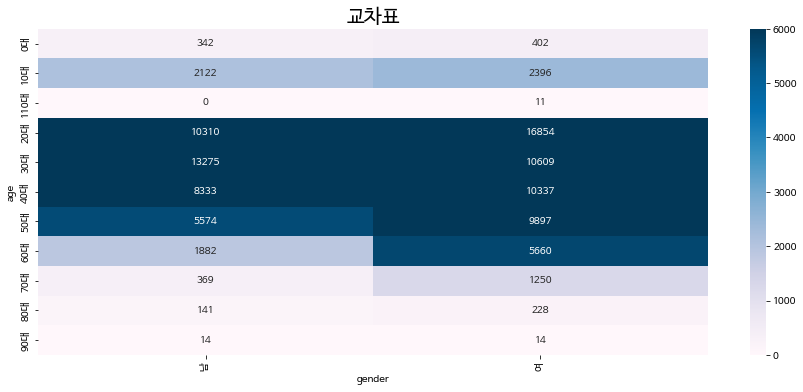

패스
answers1  1일 1회  1일 2회  2일 1회
age                          
0대          568    131     45
10대        3252    728    538
110대         11      0      0
20대       20503   4888   1773
30대       16553   6343    988
40대       14029   3165   1476
50대       12279   1244   1948
60대        5585    419   1538
70대         935     66    618
80대         134      4    231
90대          19      0      9
1. 카이제곱 통계량: 7944.466931664397
2. p-value 0.0
3, df 20
4. 기대값 행렬:
               0            1            2
0     549.468026   126.365447    68.166527
1    3336.688902   767.364367   413.946731
2       8.123855     1.868306     1.007838
3   20061.491222  4613.697580  2488.811198
4   17639.105299  4056.602599  2188.292102
5   13788.397920  3171.025395  1710.576685
6   11425.833113  2627.687942  1417.478944
7    5570.010558  1280.978764   691.010678
8    1195.683783   274.980724   148.335493
9     272.518416    62.673185    33.808398
10     20.678904     4.755689     2.565407


<Figure size 1080x432 with 0 Axes>

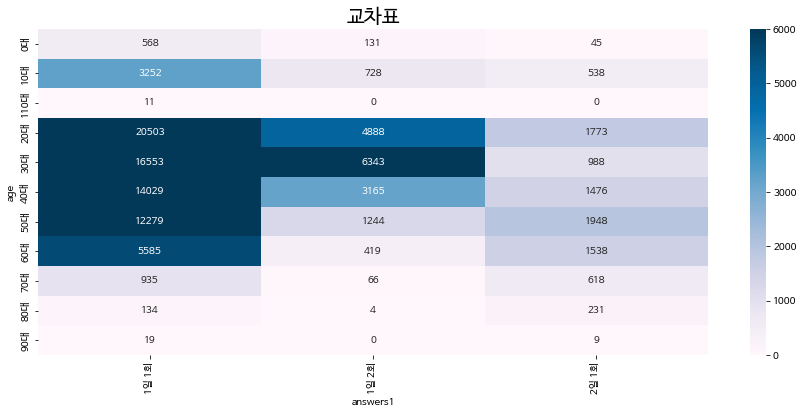

answers2  1~3회/연  4~6회/연  7회 이상/연   하지않음
age                                     
0대           171     103        4    466
10대         1198     152       23   3145
110대           0       0        0     11
20대         8926    1449      537  16252
30대         9345    2830      564  11145
40대         7458    2178      410   8624
50대         5424    2613      470   6964
60대         2106    2019      494   2923
70대          300     582      168    569
80대           60     114       35    160
90대            5       0        0     23
1. 카이제곱 통계량: 6887.106592257177
2. p-value 0.0
3, df 30
4. 기대값 행렬:
              0            1           2             3
0    260.295861    89.559688   20.121176    374.023275
1   1580.667606   543.858428  122.187463   2271.286503
2      3.848460     1.324135    0.297491      5.529914
3   9503.597800  3269.891622  734.639272  13655.871306
4   8356.056909  2875.058588  645.933013  12006.951490
5   6531.886723  2247.418516  504.922515   9385.772246
6   5412.684493 

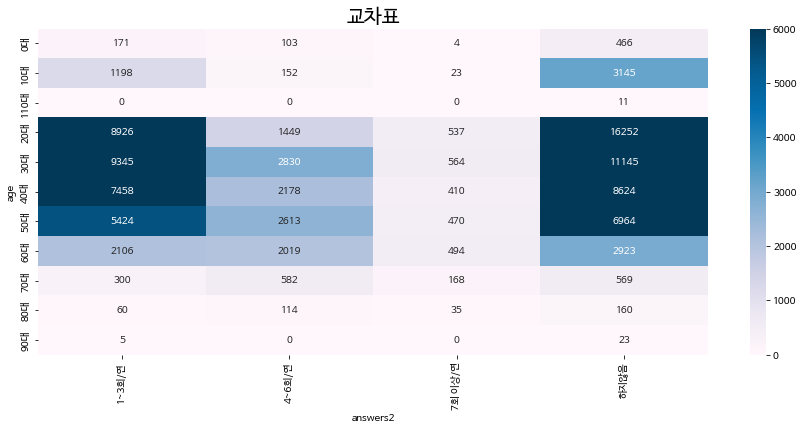

answers3  1~3회/연  4~6회/연  7회 이상/연   하지않음
age                                     
0대           103      44       28    569
10대          986     131      119   3282
110대           0       0        0     11
20대         7858    3761     3693  11852
30대         5730    3466     2437  12251
40대         3634    4321     3636   7079
50대         2321    3678     5062   4410
60대          962    1791     3157   1632
70대          146     409      684    380
80대           27      83      100    159
90대            3       6        0     19
1. 카이제곱 통계량: 12989.041571070344
2. p-value 0.0
3, df 30
4. 기대값 행렬:
              0            1            2             3
0    161.936413   131.587283   140.706899    309.769406
1    983.371926   799.074385   854.453989   1881.099700
2      2.394221     1.945511     2.080344      4.579924
3   5912.420316  4804.350730  5137.314777  11309.914177
4   5198.507099  4224.234753  4516.994041   9944.264107
5   4063.646271  3302.062587  3530.911018   7773.380124
6   3367

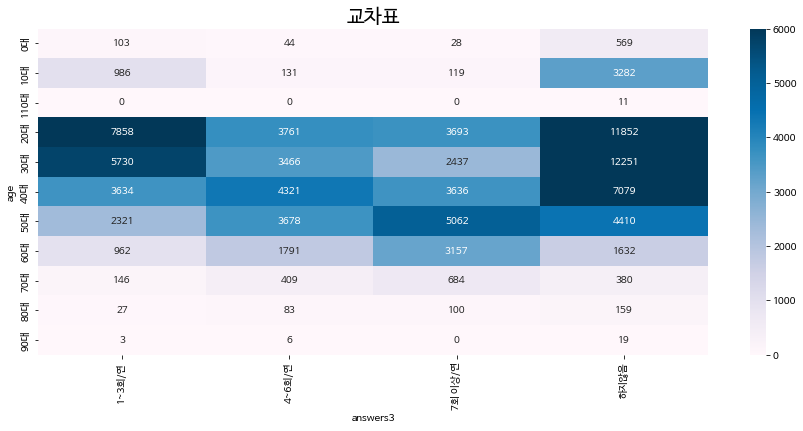

answers4  ,기타  ,염색 모발  가발 사용(붙임머리 포함)  가발 사용(붙임머리 포함),기타  \
age                                                        
0대          0       0              13                  0   
10대         0       0               8                  8   
110대        0       0               0                  0   
20대        12      13             243                 15   
30대         0       0              49                  4   
40대         0       0              71                  6   
50대         0       0              88                  0   
60대         0       0              41                  3   
70대         0       0              12                  0   
80대         0       0               2                  0   
90대         0       0               0                  0   

answers4  가발 사용(붙임머리 포함),모발이식/시술  가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발  \
age                                                                 
0대                             0                                0   
10대         

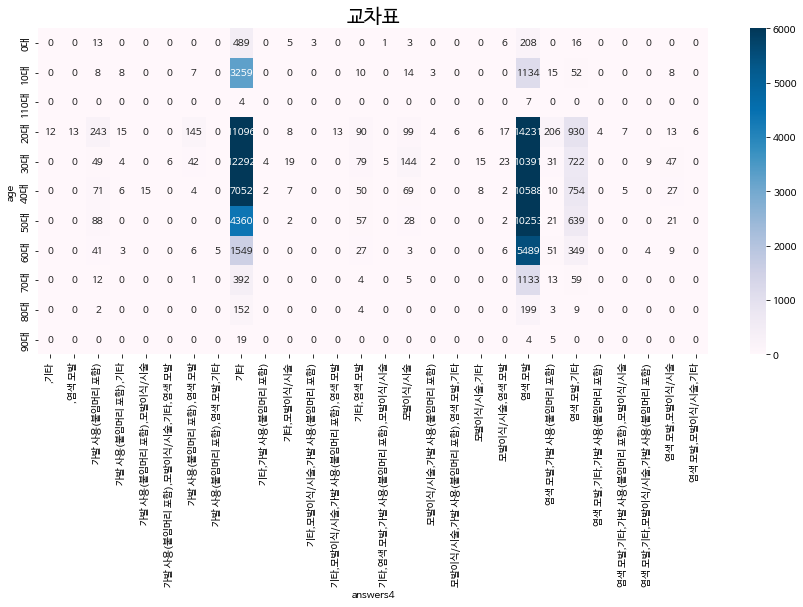

answers5  두피 세럼  두피 세럼,두피 스케일링제,샴푸  두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트  \
age                                                                             
0대           12                  0                                          0   
10대          19                  0                                          0   
110대          0                  0                                          0   
20대          51                  0                                          0   
30대          70                  9                                          0   
40대          95                  0                                          2   
50대          58                  0                                          0   
60대          14                  0                                          0   
70대           7                  0                                          0   
80대           0                  0                                          0   
90대           0             

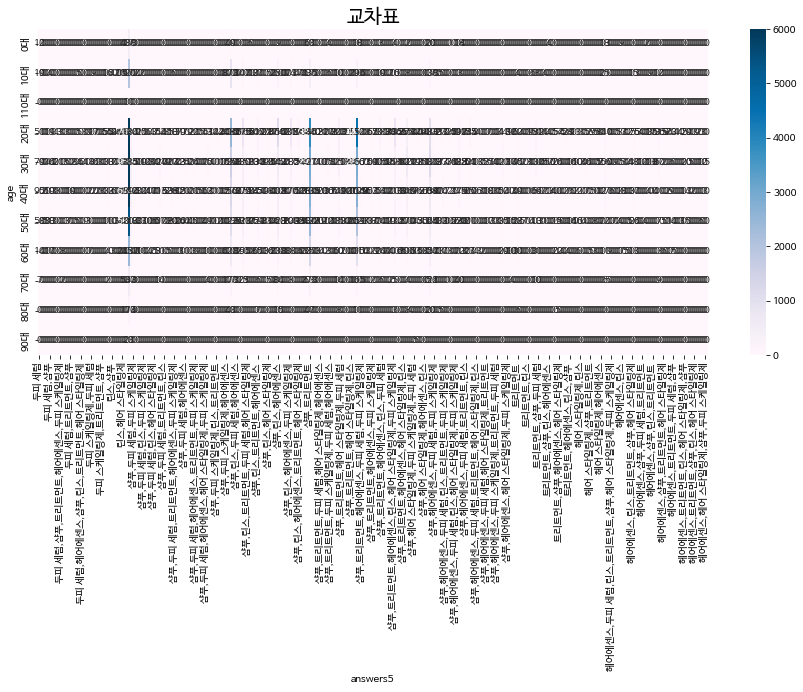

answers6   아니오      예
age                  
0대          78    666
10대        862   3656
110대         0     11
20대       3731  23433
30대       4137  19747
40대       2938  15732
50대       2047  13424
60대       1037   6505
70대        246   1373
80대         40    329
90대          4     24
1. 카이제곱 통계량: 265.2739506602515
2. p-value 3.312349677902342e-51
3, df 10
4. 기대값 행렬:
              0             1
0    112.470306    631.529694
1    682.985003   3835.014997
2      1.662867      9.337133
3   4106.375525  23057.624475
4   3610.538692  20273.461308
5   2822.339532  15847.660468
6   2338.747451  13132.252549
7   1140.122376   6401.877624
8    244.743851   1374.256149
9     55.781644    313.218356
10     4.232753     23.767247


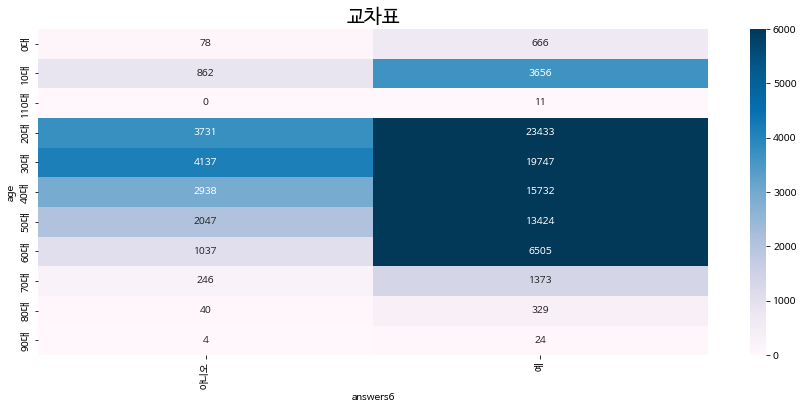

answers7   가격  두피자극   머리결   세정력     향  헹굼후느낌
age                                         
0대          5    99    74   506    37     23
10대        67   525   975  1551  1153    247
110대        0     0     0    11     0      0
20대       627  4316  6555  8350  5214   2102
30대       513  5863  4721  8621  2068   2098
40대       203  5210  3954  6998   927   1378
50대       194  4373  3950  5771   517    666
60대       101  2220  2124  2615   209    273
70대        31   406   450   644    48     40
80대         0    95    88   175     4      7
90대         0     5     7    11     0      5
1. 카이제곱 통계량: 7964.564343531073
2. p-value 0.0
3, df 50
4. 기대값 행렬:
             0            1            2            3            4  \
0    12.950450   171.918896   170.327055   262.229874    75.701740   
1    78.642651  1043.991362  1034.324775  1592.412058   459.704919   
2     0.191472     2.541812     2.518276     3.877055     1.119246   
3   472.830674  6276.888302  6218.768966  9574.210078  2763.927495   

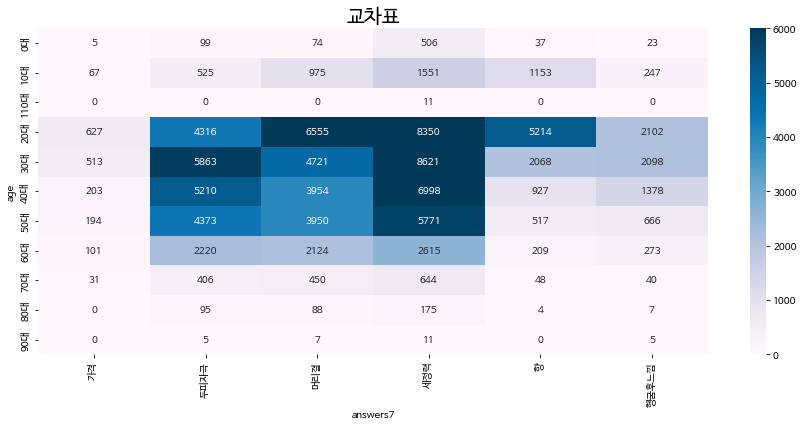

gender        남      여
answers1              
1일 1회     27942  45926
1일 2회     13367   3621
2일 1회      1053   8111
1. 카이제곱 통계량: 13379.364467196521
2. p-value 0.0
3, df 2
4. 기대값 행렬:
              0             1
0  31285.705019  42582.294981
1   7195.017556   9792.982444
2   3881.277425   5282.722575


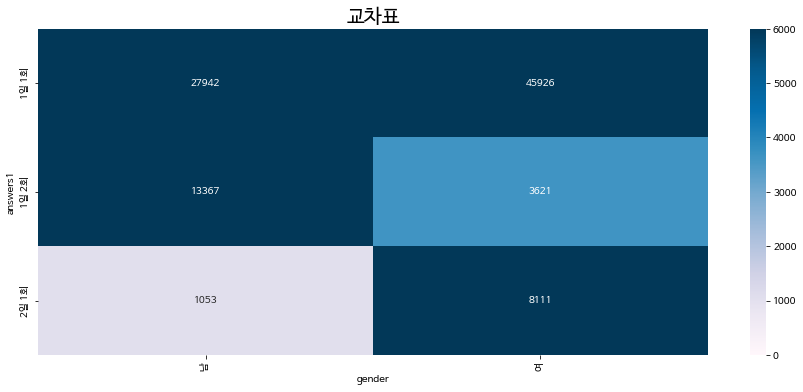

age        0대   10대  110대    20대    30대    40대    50대   60대  70대  80대  90대
answers1                                                                  
1일 1회     568  3252    11  20503  16553  14029  12279  5585  935  134   19
1일 2회     131   728     0   4888   6343   3165   1244   419   66    4    0
2일 1회      45   538     0   1773    988   1476   1948  1538  618  231    9
1. 카이제곱 통계량: 7944.466931664398
2. p-value 0.0
3, df 20
4. 기대값 행렬:
           0            1         2             3             4   \
0  549.468026  3336.688902  8.123855  20061.491222  17639.105299   
1  126.365447   767.364367  1.868306   4613.697580   4056.602599   
2   68.166527   413.946731  1.007838   2488.811198   2188.292102   

             5             6            7            8           9          10  
0  13788.397920  11425.833113  5570.010558  1195.683783  272.518416  20.678904  
1   3171.025395   2627.687942  1280.978764   274.980724   62.673185   4.755689  
2   1710.576685   1417.478944   691.010678 

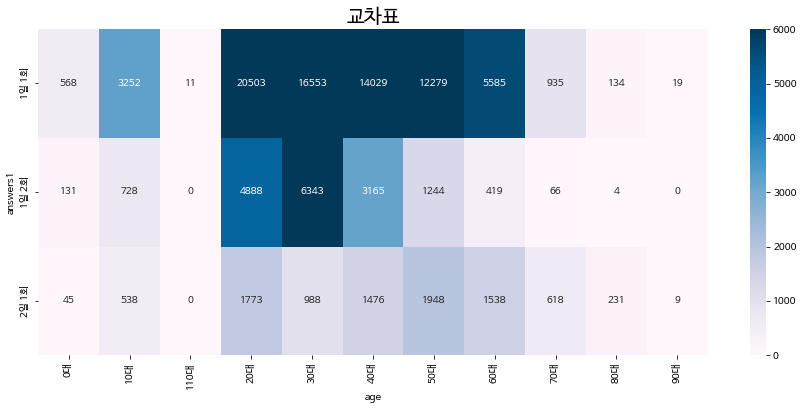

패스
answers2  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers1                                
1일 1회      25811    8644     1804  37609
1일 2회       5411    2159      707   8711
2일 1회       3771    1237      194   3962
1. 카이제곱 통계량: 440.41815127636437
2. p-value 5.6623713349260414e-92
3, df 6
4. 기대값 행렬:
              0            1            2             3
0  25843.460548  8891.928814  1997.729854  37134.880784
1   5943.422156  2044.946211   459.433513   8540.198120
2   3206.117297  1103.124975   247.836633   4606.921096


<Figure size 1080x432 with 0 Axes>

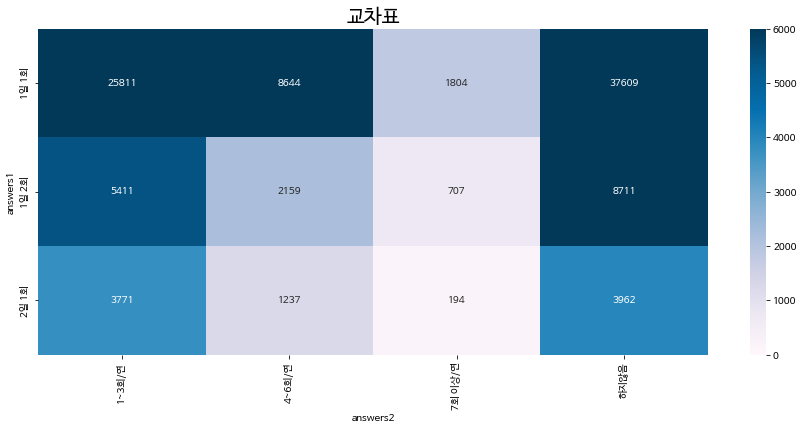

answers3  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers1                                
1일 1회      16618   13730    14433  29087
1일 2회       3281    1871     1647  10189
2일 1회       1871    2089     2836   2368
1. 카이제곱 통계량: 4162.17015676717
2. p-value 0.0
3, df 6
4. 기대값 행렬:
              0             1             2             3
0  16077.848030  13064.636273  13970.076865  30755.438832
1   3697.548090   3004.576285   3212.807518   7073.068106
2   1994.603879   1620.787443   1733.115617   3815.493061


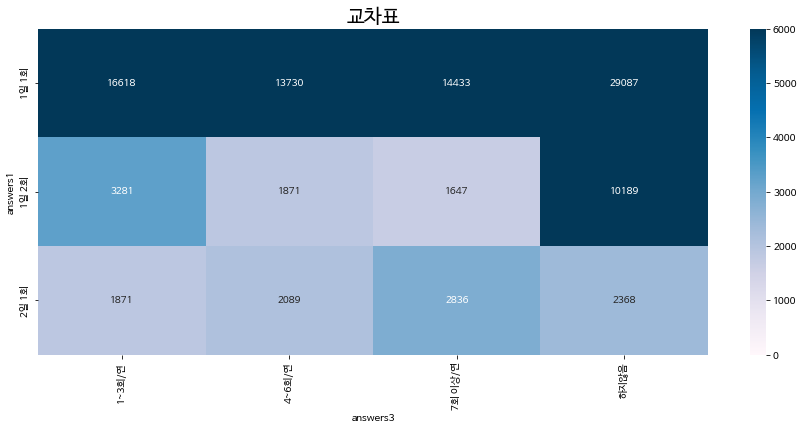

answers4  ,기타  ,염색 모발  가발 사용(붙임머리 포함)  가발 사용(붙임머리 포함),기타  \
answers1                                                   
1일 1회      12      13             394                 18   
1일 2회       0       0              76                 18   
2일 1회       0       0              57                  0   

answers4  가발 사용(붙임머리 포함),모발이식/시술  가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발  \
answers1                                                            
1일 1회                          0                                6   
1일 2회                          6                                0   
2일 1회                          9                                0   

answers4  가발 사용(붙임머리 포함),염색 모발  가발 사용(붙임머리 포함),염색 모발,기타     기타  \
answers1                                                         
1일 1회                      166                        5  27941   
1일 2회                        8                        0  10463   
2일 1회                       31                        0   2260   

answers4  기타,가발 사용(붙임머

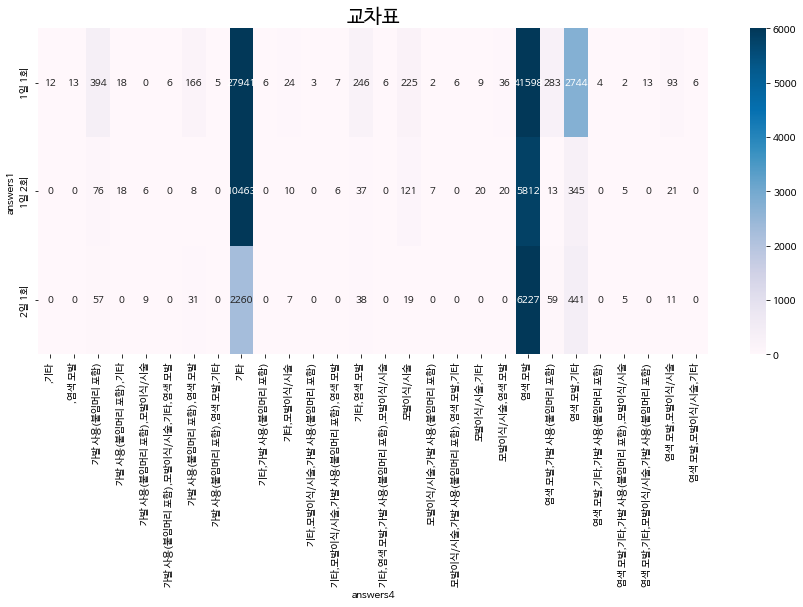

answers5  두피 세럼  두피 세럼,두피 스케일링제,샴푸  두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트  \
answers1                                                                        
1일 1회       258                  9                                          2   
1일 2회        64                  0                                          0   
2일 1회         4                  0                                          0   

answers5  두피 세럼,린스  두피 세럼,린스,두피 스케일링제  두피 세럼,샴푸  \
answers1                                          
1일 1회            5                  0        63   
1일 2회            6                  4        28   
2일 1회            0                  0        14   

answers5  두피 세럼,샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제  두피 세럼,샴푸,트리트먼트  \
answers1                                                              
1일 1회                                             9               5   
1일 2회                                             0               0   
2일 1회                                             0   

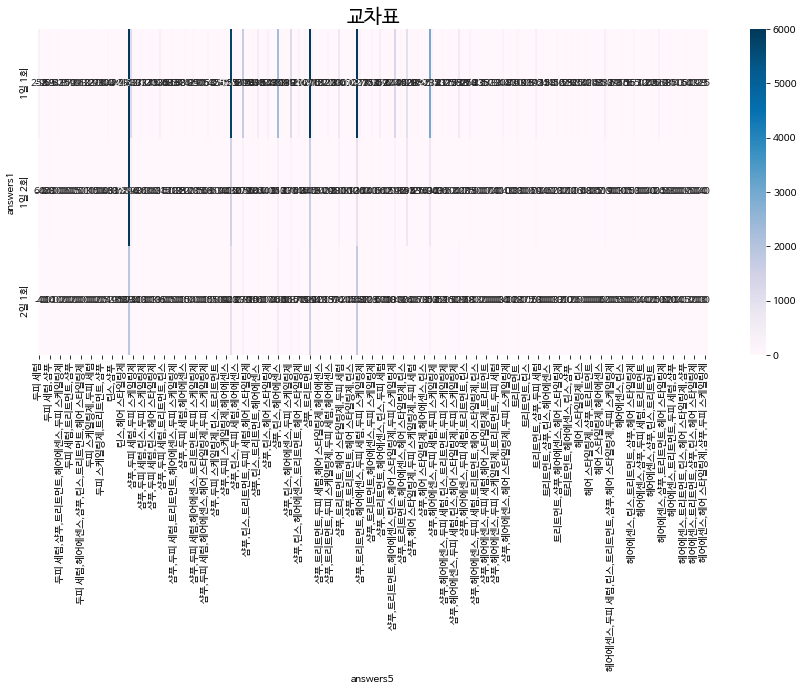

answers6    아니오      예
answers1              
1일 1회     11029  62839
1일 2회      2787  14201
2일 1회      1304   7860
1. 카이제곱 통계량: 29.608901674711387
2. p-value 3.7197066721466536e-07
3, df 2
4. 기대값 행렬:
              0             1
0  11166.608278  62701.391722
1   2568.071986  14419.928014
2   1385.319736   7778.680264


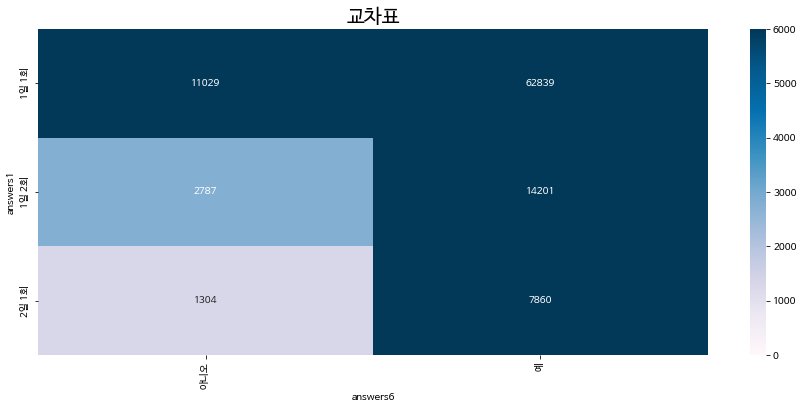

answers7    가격   두피자극    머리결    세정력     향  헹굼후느낌
answers1                                        
1일 1회     1143  16598  17350  26645  7301   4831
1일 2회      462   4198   2913   5810  2153   1452
2일 1회      136   2316   2635   2798   723    556
1. 카이제곱 통계량: 882.1000279359355
2. p-value 4.5300235344422185e-183
3, df 10
4. 기대값 행렬:
             0             1             2             3            4  \
0  1285.784723  17068.958368  16910.912458  26035.478944  7516.043151   
1   295.701940   3925.481464   3889.134413   5987.582124  1728.523055   
2   159.513337   2117.560168   2097.953129   3229.938932   932.433793   

             5  
0  5050.822356  
1  1161.577005  
2   626.600640  


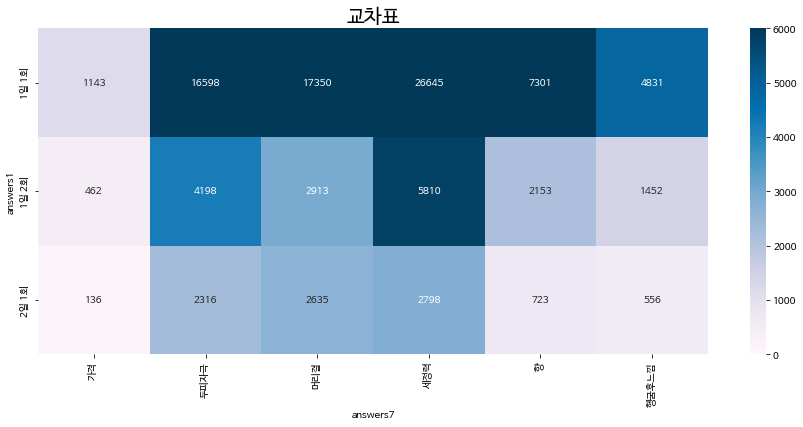

gender        남      여
answers2              
1~3회/연    11192  23801
4~6회/연     5270   6770
7회 이상/연    1332   1373
하지않음      24568  25714
1. 카이제곱 통계량: 2475.700411034782
2. p-value 0.0
3, df 3
4. 기대값 행렬:
              0             1
0  14820.770506  20172.229494
1   5099.364927   6940.635073
2   1145.662967   1559.337033
3  21296.201600  28985.798400


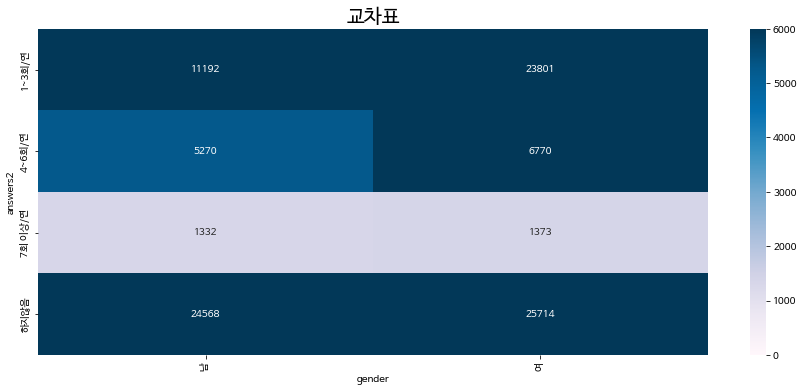

age        0대   10대  110대    20대    30대   40대   50대   60대  70대  80대  90대
answers2                                                                
1~3회/연    171  1198     0   8926   9345  7458  5424  2106  300   60    5
4~6회/연    103   152     0   1449   2830  2178  2613  2019  582  114    0
7회 이상/연     4    23     0    537    564   410   470   494  168   35    0
하지않음      466  3145    11  16252  11145  8624  6964  2923  569  160   23
1. 카이제곱 통계량: 6887.106592257175
2. p-value 0.0
3, df 30
4. 기대값 행렬:
           0            1         2             3             4            5   \
0  260.295861  1580.667606  3.848460   9503.597800   8356.056909  6531.886723   
1   89.559688   543.858428  1.324135   3269.891622   2875.058588  2247.418516   
2   20.121176   122.187463  0.297491    734.639272    645.933013   504.922515   
3  374.023275  2271.286503  5.529914  13655.871306  12006.951490  9385.772246   

            6            7           8           9          10  
0  5412.684493  2638.6443

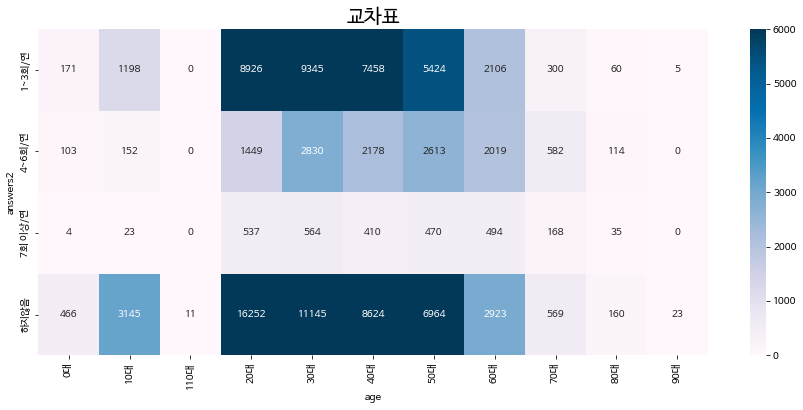

answers1  1일 1회  1일 2회  2일 1회
answers2                     
1~3회/연    25811   5411   3771
4~6회/연     8644   2159   1237
7회 이상/연    1804    707    194
하지않음      37609   8711   3962
1. 카이제곱 통계량: 440.41815127636426
2. p-value 5.662371334926364e-92
3, df 6
4. 기대값 행렬:
              0            1            2
0  25843.460548  5943.422156  3206.117297
1   8891.928814  2044.946211  1103.124975
2   1997.729854   459.433513   247.836633
3  37134.880784  8540.198120  4606.921096


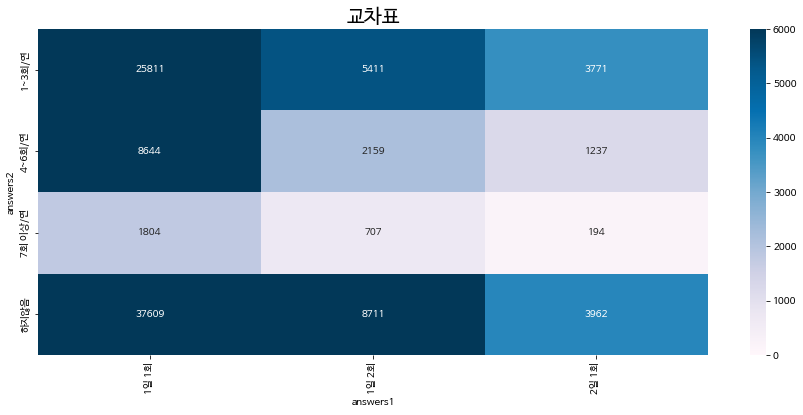

패스
answers3  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers2                                
1~3회/연     10657    6411     5335  12590
4~6회/연      1441    3678     2654   4267
7회 이상/연      255     179     1145   1126
하지않음        9417    7422     9782  23661
1. 카이제곱 통계량: 5549.985720054709
2. p-value 0.0
3, df 9
4. 기대값 행렬:
              0            1            2             3
0   7616.452809  6189.023895  6617.952290  14569.571006
1   2620.583883  2129.450110  2277.030994   5012.935013
2    588.760748   478.418816   511.575485   1126.244951
3  10944.202559  8893.107179  9509.441232  20935.249030


<Figure size 1080x432 with 0 Axes>

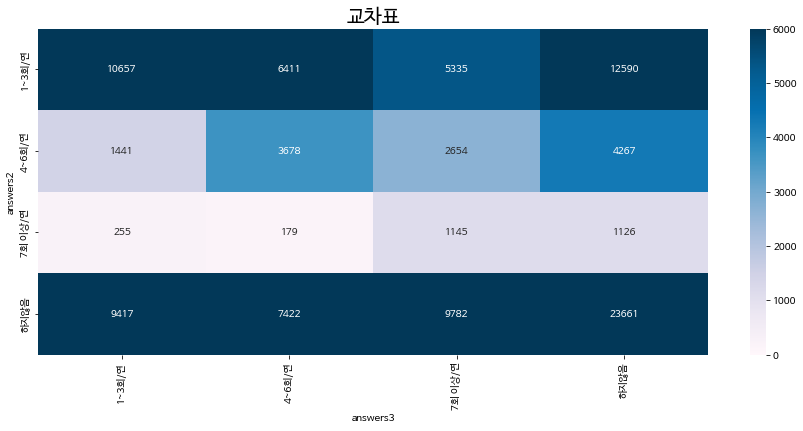

answers4  ,기타  ,염색 모발  가발 사용(붙임머리 포함)  가발 사용(붙임머리 포함),기타  \
answers2                                                   
1~3회/연     12       5             118                 21   
4~6회/연      0       0              19                  0   
7회 이상/연     0       0              10                  0   
하지않음        0       8             380                 15   

answers4  가발 사용(붙임머리 포함),모발이식/시술  가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발  \
answers2                                                            
1~3회/연                         9                                6   
4~6회/연                         6                                0   
7회 이상/연                        0                                0   
하지않음                           0                                0   

answers4  가발 사용(붙임머리 포함),염색 모발  가발 사용(붙임머리 포함),염색 모발,기타     기타  \
answers2                                                         
1~3회/연                      48                        5  12838   
4~6회/연                    

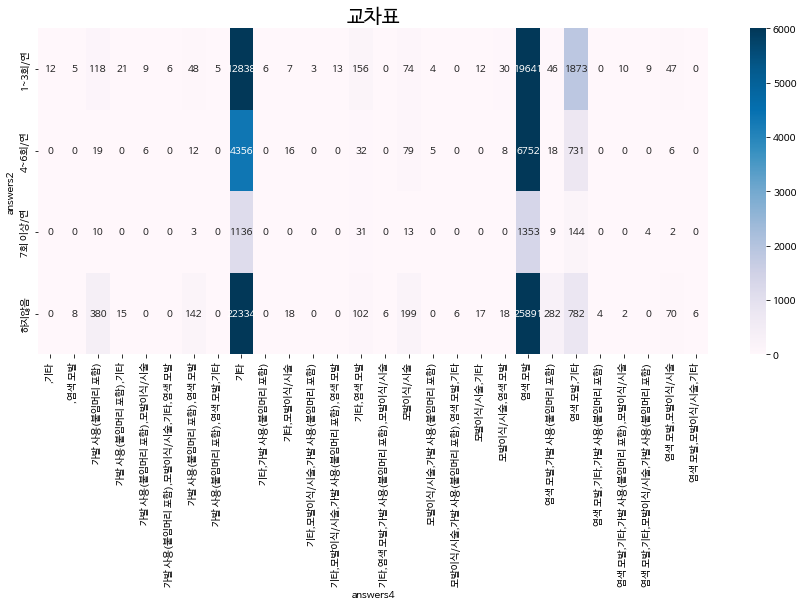

answers5  두피 세럼  두피 세럼,두피 스케일링제,샴푸  두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트  \
answers2                                                                        
1~3회/연      122                  9                                          2   
4~6회/연       29                  0                                          0   
7회 이상/연       0                  0                                          0   
하지않음        175                  0                                          0   

answers5  두피 세럼,린스  두피 세럼,린스,두피 스케일링제  두피 세럼,샴푸  \
answers2                                          
1~3회/연           0                  0        39   
4~6회/연          11                  4         8   
7회 이상/연          0                  0         5   
하지않음             0                  0        53   

answers5  두피 세럼,샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제  두피 세럼,샴푸,트리트먼트  \
answers2                                                              
1~3회/연                                            0             

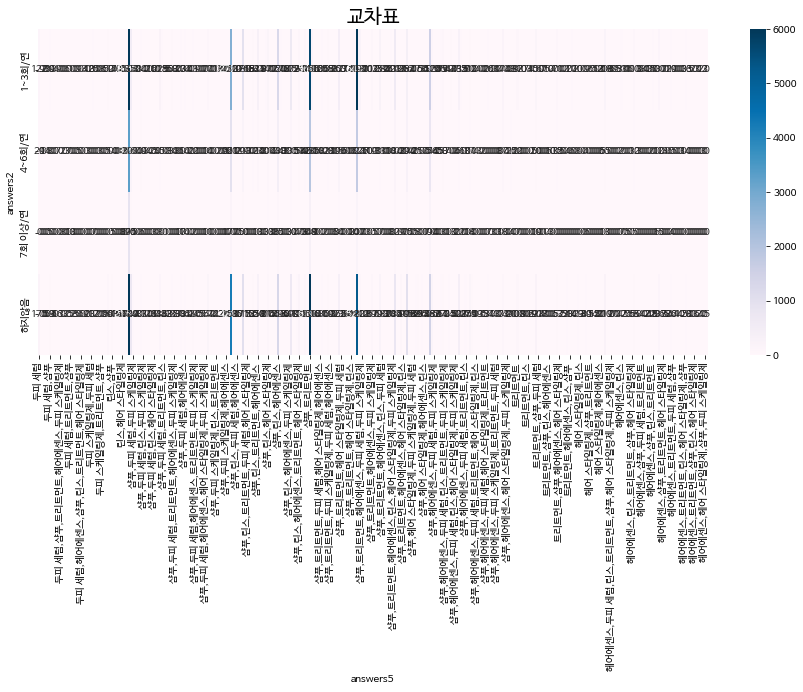

answers6   아니오      예
answers2             
1~3회/연    5229  29764
4~6회/연    1427  10613
7회 이상/연    257   2448
하지않음      8207  42075
1. 카이제곱 통계량: 224.22251463582398
2. p-value 2.4541627239782172e-48
3, df 3
4. 기대값 행렬:
             0             1
0  5289.883623  29703.116377
1  1820.083983  10219.916017
2   408.914217   2296.085783
3  7601.118176  42680.881824


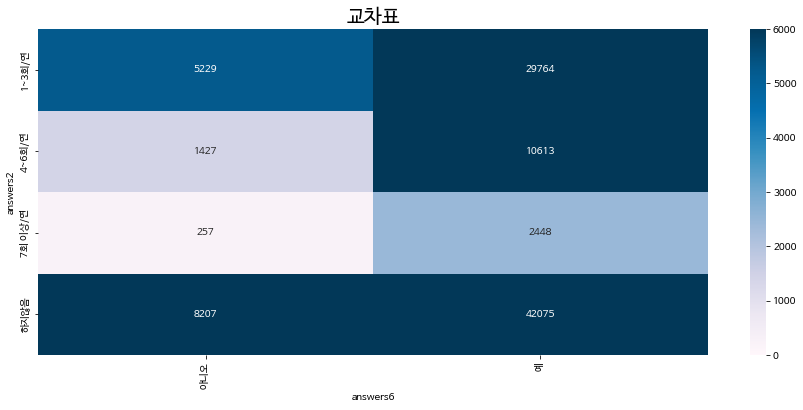

answers7    가격   두피자극   머리결    세정력     향  헹굼후느낌
answers2                                       
1~3회/연     520   8341  9562  10652  3386   2532
4~6회/연     143   2959  3308   4078   835    717
7회 이상/연     52    745   643    863   210    192
하지않음      1026  11067  9385  19660  5746   3398
1. 카이제곱 통계량: 1637.9534162881573
2. p-value 0.0
3, df 15
4. 기대값 행렬:
            0             1             2             3            4  \
0  609.106309   8085.964967   8011.094921  12333.615567  3560.525505   
1  209.574485   2782.128374   2756.367926   4243.612478  1225.065787   
2   47.084633    625.054589    619.267047    953.402969   275.232803   
3  875.234573  11618.852070  11511.270106  17722.368986  5116.175905   

             5  
0  2392.692731  
1   823.250950  
2   184.957958  
3  3438.098360  


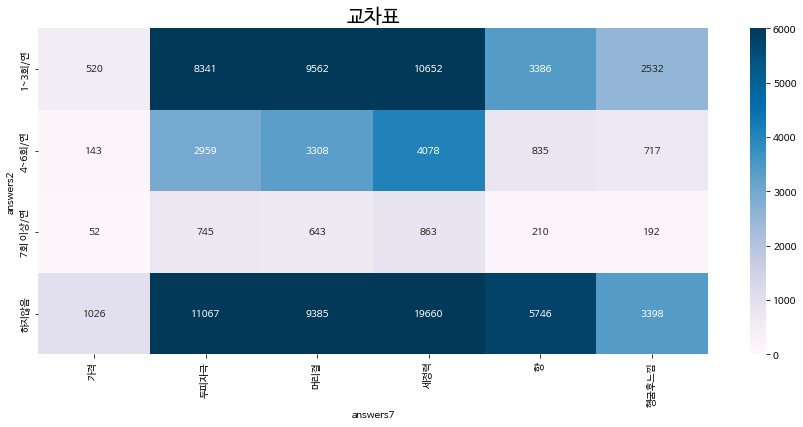

gender        남      여
answers3              
1~3회/연     6904  14866
4~6회/연     4179  13511
7회 이상/연    3475  15441
하지않음      27804  13840
1. 카이제곱 통계량: 18172.584105413644
2. p-value 0.0
3, df 3
4. 기대값 행렬:
              0             1
0   9220.363327  12549.636673
1   7492.339332  10197.660668
2   8011.593601  10904.406399
3  17637.703739  24006.296261


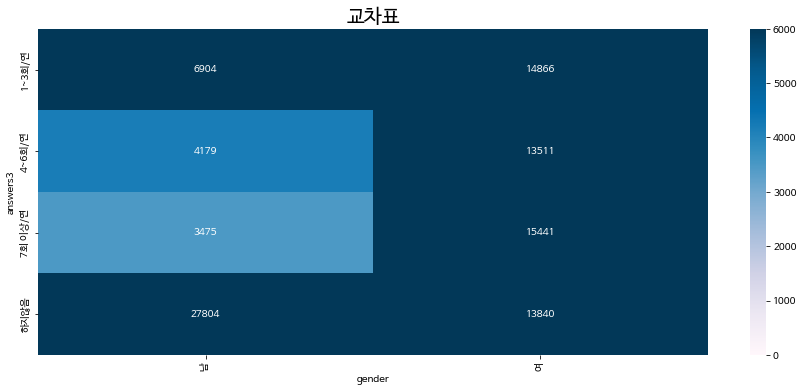

age        0대   10대  110대    20대    30대   40대   50대   60대  70대  80대  90대
answers3                                                                
1~3회/연    103   986     0   7858   5730  3634  2321   962  146   27    3
4~6회/연     44   131     0   3761   3466  4321  3678  1791  409   83    6
7회 이상/연    28   119     0   3693   2437  3636  5062  3157  684  100    0
하지않음      569  3282    11  11852  12251  7079  4410  1632  380  159   19
1. 카이제곱 통계량: 12989.041571070346
2. p-value 0.0
3, df 30
4. 기대값 행렬:
           0            1         2             3            4            5   \
0  161.936413   983.371926  2.394221   5912.420316  5198.507099  4063.646271   
1  131.587283   799.074385  1.945511   4804.350730  4224.234753  3302.062587   
2  140.706899   854.453989  2.080344   5137.314777  4516.994041  3530.911018   
3  309.769406  1881.099700  4.579924  11309.914177  9944.264107  7773.380124   

            6            7           8           9          10  
0  3367.363227  1641.565087  

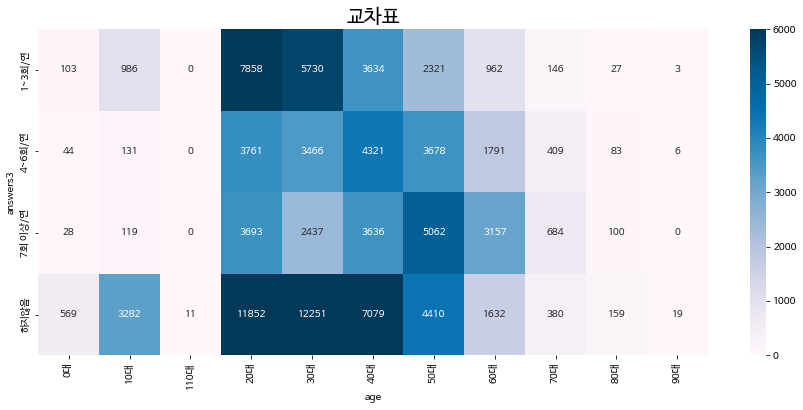

answers1  1일 1회  1일 2회  2일 1회
answers3                     
1~3회/연    16618   3281   1871
4~6회/연    13730   1871   2089
7회 이상/연   14433   1647   2836
하지않음      29087  10189   2368
1. 카이제곱 통계량: 4162.17015676717
2. p-value 0.0
3, df 6
4. 기대값 행렬:
              0            1            2
0  16077.848030  3697.548090  1994.603879
1  13064.636273  3004.576285  1620.787443
2  13970.076865  3212.807518  1733.115617
3  30755.438832  7073.068106  3815.493061


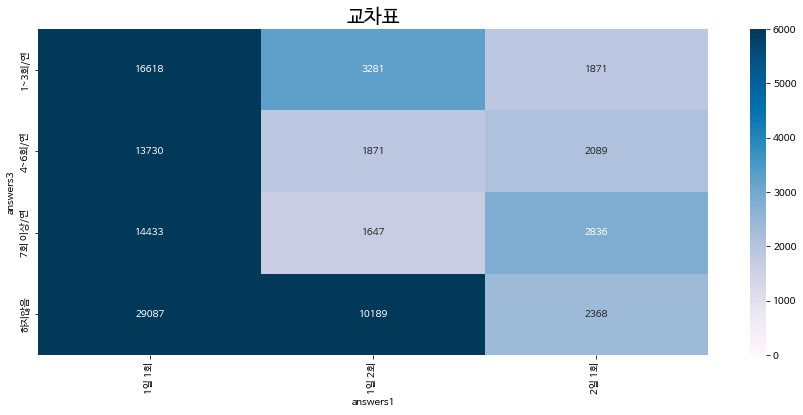

answers2  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers3                                
1~3회/연     10657    1441      255   9417
4~6회/연      6411    3678      179   7422
7회 이상/연     5335    2654     1145   9782
하지않음       12590    4267     1126  23661
1. 카이제곱 통계량: 5549.985720054709
2. p-value 0.0
3, df 9
4. 기대값 행렬:
              0            1            2             3
0   7616.452809  2620.583883   588.760748  10944.202559
1   6189.023895  2129.450110   478.418816   8893.107179
2   6617.952290  2277.030994   511.575485   9509.441232
3  14569.571006  5012.935013  1126.244951  20935.249030


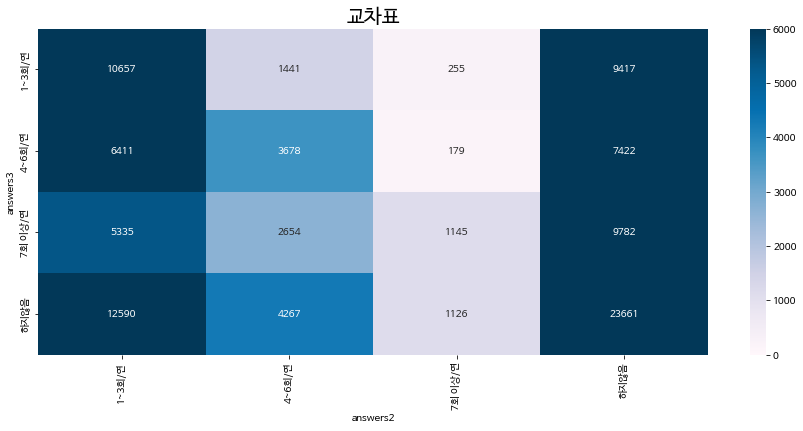

패스
answers4  ,기타  ,염색 모발  가발 사용(붙임머리 포함)  가발 사용(붙임머리 포함),기타  \
answers3                                                   
1~3회/연      0       5             151                  5   
4~6회/연      0       8              28                 19   
7회 이상/연     0       0              55                  3   
하지않음       12       0             293                  9   

answers4  가발 사용(붙임머리 포함),모발이식/시술  가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발  \
answers3                                                            
1~3회/연                         0                                0   
4~6회/연                        15                                6   
7회 이상/연                        0                                0   
하지않음                           0                                0   

answers4  가발 사용(붙임머리 포함),염색 모발  가발 사용(붙임머리 포함),염색 모발,기타     기타  \
answers3                                                         
1~3회/연                      98                        0   2668   
4~6회/연                 

<Figure size 1080x432 with 0 Axes>

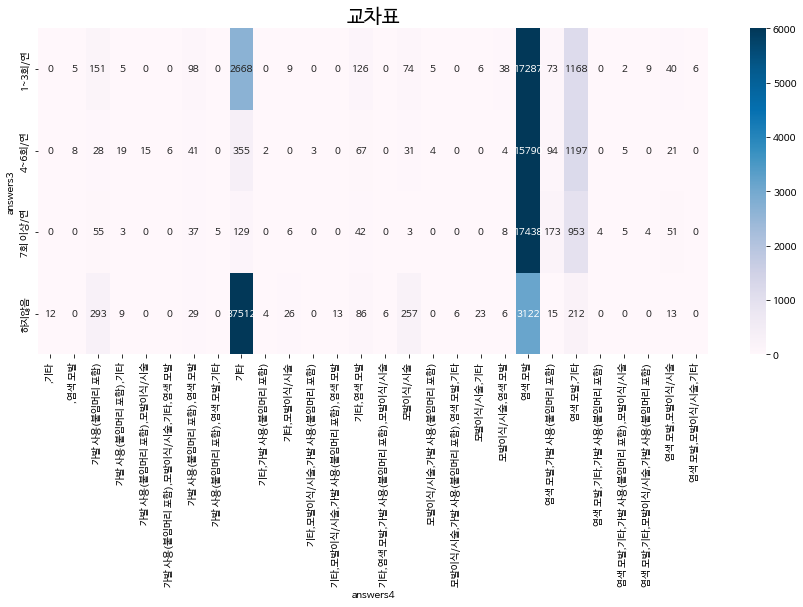

answers5  두피 세럼  두피 세럼,두피 스케일링제,샴푸  두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트  \
answers3                                                                        
1~3회/연      116                  0                                          0   
4~6회/연       81                  9                                          0   
7회 이상/연      26                  0                                          2   
하지않음        103                  0                                          0   

answers5  두피 세럼,린스  두피 세럼,린스,두피 스케일링제  두피 세럼,샴푸  \
answers3                                          
1~3회/연           5                  4         8   
4~6회/연           6                  0         9   
7회 이상/연          0                  0        45   
하지않음             0                  0        43   

answers5  두피 세럼,샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제  두피 세럼,샴푸,트리트먼트  \
answers3                                                              
1~3회/연                                            0             

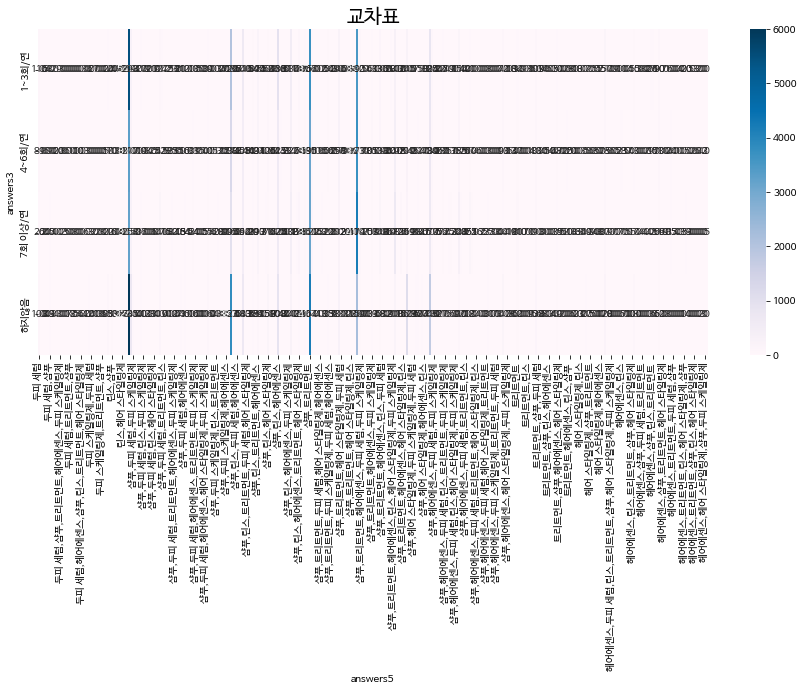

answers6   아니오      예
answers3             
1~3회/연    3159  18611
4~6회/연    2347  15343
7회 이상/연   2002  16914
하지않음      7612  34032
1. 카이제곱 통계량: 680.7873537965619
2. p-value 3.076003177490129e-147
3, df 3
4. 기대값 행렬:
             0             1
0  3290.965807  18479.034193
1  2674.193161  15015.806839
2  2859.527295  16056.472705
3  6295.313737  35348.686263


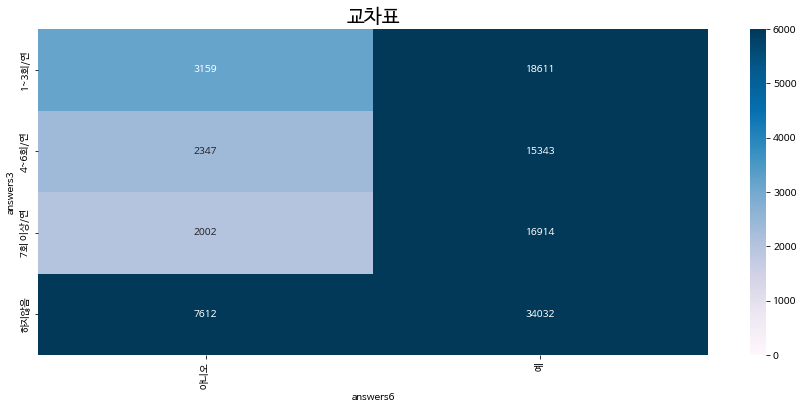

answers7   가격  두피자극   머리결    세정력     향  헹굼후느낌
answers3                                     
1~3회/연    339  4601  5665   6846  2782   1537
4~6회/연    199  4142  5049   5947  1332   1021
7회 이상/연   215  4664  5761   5968  1196   1112
하지않음      988  9705  6423  16492  4867   3169
1. 카이제곱 통계량: 3191.678125414738
2. p-value 0.0
3, df 15
4. 기대값 행렬:
            0            1            2             3            4  \
0  378.939912  5030.476305  4983.897820   7673.043491  2215.089882   
1  307.921316  4087.695261  4049.846231   6235.008698  1799.951310   
2  329.261708  4370.991722  4330.519576   6667.124055  1924.696381   
3  724.877065  9622.836713  9533.736373  14677.823755  4237.262428   

             5  
0  1488.552589  
1  1209.577185  
2  1293.406559  
3  2847.463667  


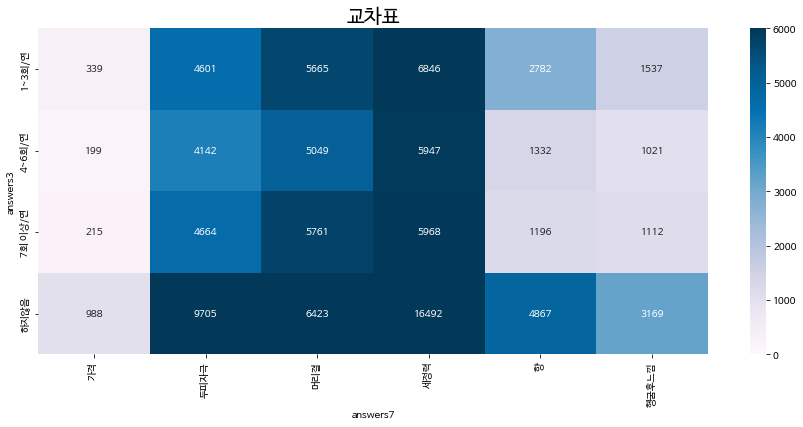

gender                               남      여
answers4                                     
,기타                                  0     12
,염색 모발                               0     13
가발 사용(붙임머리 포함)                     160    367
가발 사용(붙임머리 포함),기타                    4     32
가발 사용(붙임머리 포함),모발이식/시술               0     15
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발      0      6
가발 사용(붙임머리 포함),염색 모발                26    179
가발 사용(붙임머리 포함),염색 모발,기타              0      5
기타                               27952  12712
기타,가발 사용(붙임머리 포함)                    6      0
기타,모발이식/시술                          25     16
기타,모발이식/시술,가발 사용(붙임머리 포함)            0      3
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발      7      6
기타,염색 모발                            91    230
기타,염색 모발,가발 사용(붙임머리 포함),모발이식/시술      6      0
모발이식/시술                            256    109
모발이식/시술,가발 사용(붙임머리 포함)               4      5
모발이식/시술,가발 사용(붙임머리 포함),염색 모발,기타      0      6
모발이식/시술,기타                          23      6
모발이식/시술,염색 모발                     

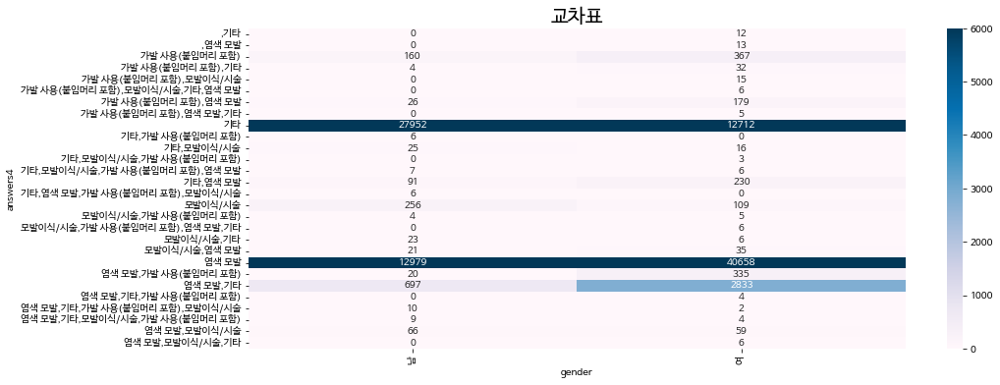

age                               0대   10대  110대    20대    30대    40대    50대  \
answers4                                                                       
,기타                                0     0     0     12      0      0      0   
,염색 모발                             0     0     0     13      0      0      0   
가발 사용(붙임머리 포함)                    13     8     0    243     49     71     88   
가발 사용(붙임머리 포함),기타                  0     8     0     15      4      6      0   
가발 사용(붙임머리 포함),모발이식/시술             0     0     0      0      0     15      0   
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발    0     0     0      0      6      0      0   
가발 사용(붙임머리 포함),염색 모발               0     7     0    145     42      4      0   
가발 사용(붙임머리 포함),염색 모발,기타            0     0     0      0      0      0      0   
기타                               489  3259     4  11096  12292   7052   4360   
기타,가발 사용(붙임머리 포함)                  0     0     0      0      4      2      0   
기타,모발이식/시술                         5    

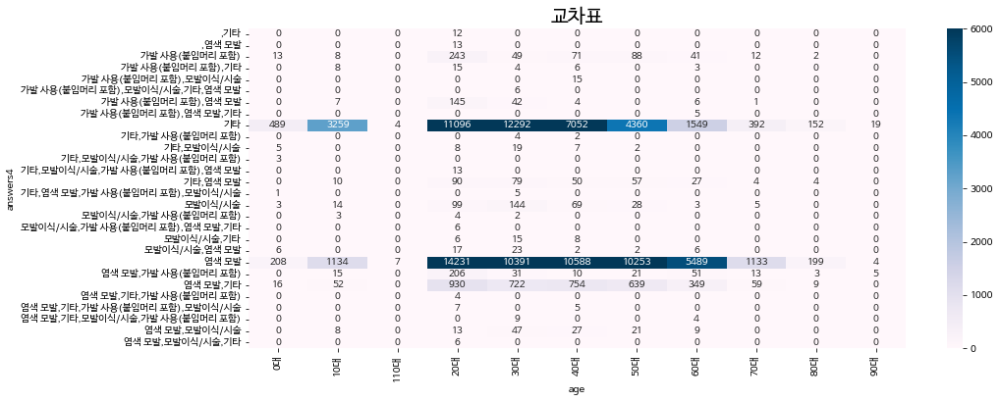

answers1                         1일 1회  1일 2회  2일 1회
answers4                                            
,기타                                 12      0      0
,염색 모발                              13      0      0
가발 사용(붙임머리 포함)                     394     76     57
가발 사용(붙임머리 포함),기타                   18     18      0
가발 사용(붙임머리 포함),모발이식/시술               0      6      9
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발      6      0      0
가발 사용(붙임머리 포함),염색 모발               166      8     31
가발 사용(붙임머리 포함),염색 모발,기타              5      0      0
기타                               27941  10463   2260
기타,가발 사용(붙임머리 포함)                    6      0      0
기타,모발이식/시술                          24     10      7
기타,모발이식/시술,가발 사용(붙임머리 포함)            3      0      0
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발      7      6      0
기타,염색 모발                           246     37     38
기타,염색 모발,가발 사용(붙임머리 포함),모발이식/시술      6      0      0
모발이식/시술                            225    121     19
모발이식/시술,가발 사용(붙임머리 포함)               2      7 

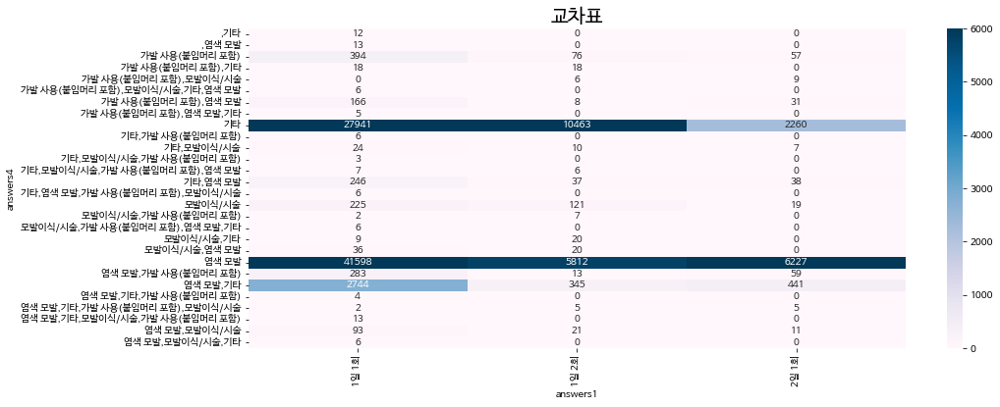

answers2                         1~3회/연  4~6회/연  7회 이상/연   하지않음
answers4                                                       
,기타                                  12       0        0      0
,염색 모발                                5       0        0      8
가발 사용(붙임머리 포함)                      118      19       10    380
가발 사용(붙임머리 포함),기타                    21       0        0     15
가발 사용(붙임머리 포함),모발이식/시술                9       6        0      0
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발       6       0        0      0
가발 사용(붙임머리 포함),염색 모발                 48      12        3    142
가발 사용(붙임머리 포함),염색 모발,기타               5       0        0      0
기타                                12838    4356     1136  22334
기타,가발 사용(붙임머리 포함)                     6       0        0      0
기타,모발이식/시술                            7      16        0     18
기타,모발이식/시술,가발 사용(붙임머리 포함)             3       0        0      0
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발      13       0        0      0
기타,염색 모발                            156 

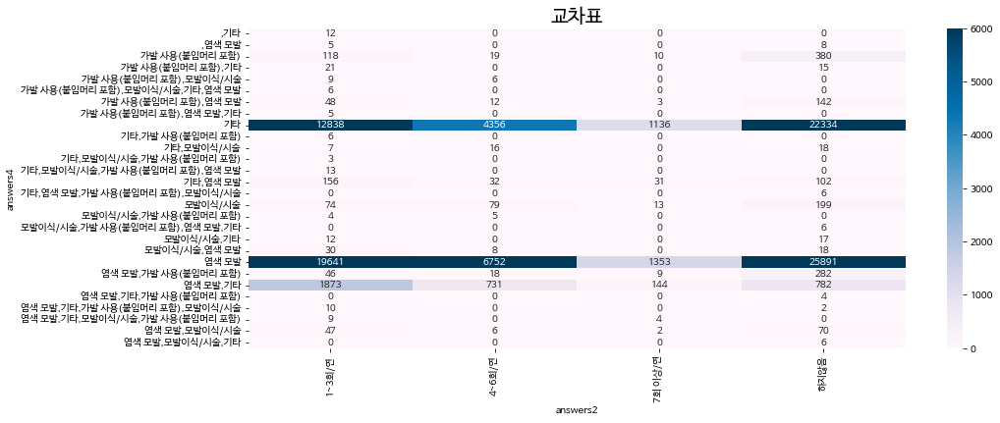

answers3                         1~3회/연  4~6회/연  7회 이상/연   하지않음
answers4                                                       
,기타                                   0       0        0     12
,염색 모발                                5       8        0      0
가발 사용(붙임머리 포함)                      151      28       55    293
가발 사용(붙임머리 포함),기타                     5      19        3      9
가발 사용(붙임머리 포함),모발이식/시술                0      15        0      0
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발       0       6        0      0
가발 사용(붙임머리 포함),염색 모발                 98      41       37     29
가발 사용(붙임머리 포함),염색 모발,기타               0       0        5      0
기타                                 2668     355      129  37512
기타,가발 사용(붙임머리 포함)                     0       2        0      4
기타,모발이식/시술                            9       0        6     26
기타,모발이식/시술,가발 사용(붙임머리 포함)             0       3        0      0
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발       0       0        0     13
기타,염색 모발                            126 

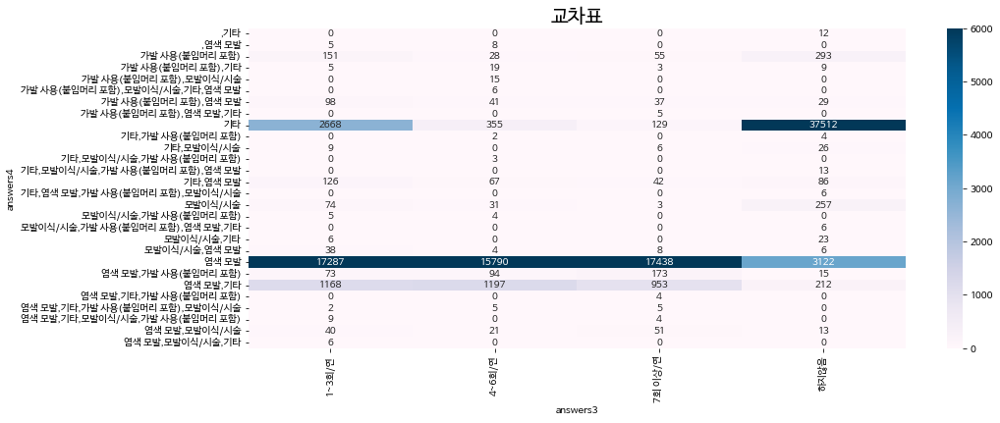

패스
answers5                         두피 세럼  두피 세럼,두피 스케일링제,샴푸  \
answers4                                                    
,기타                                  0                  0   
,염색 모발                               0                  0   
가발 사용(붙임머리 포함)                      22                  0   
가발 사용(붙임머리 포함),기타                    3                  0   
가발 사용(붙임머리 포함),모발이식/시술               0                  0   
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발      0                  0   
가발 사용(붙임머리 포함),염색 모발                 3                  0   
가발 사용(붙임머리 포함),염색 모발,기타              0                  0   
기타                                  41                  0   
기타,가발 사용(붙임머리 포함)                    0                  0   
기타,모발이식/시술                           0                  0   
기타,모발이식/시술,가발 사용(붙임머리 포함)            3                  0   
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발      0                  0   
기타,염색 모발                             6                  0   
기타,염색 모발,가발 사용(붙임머리 포

<Figure size 1080x432 with 0 Axes>

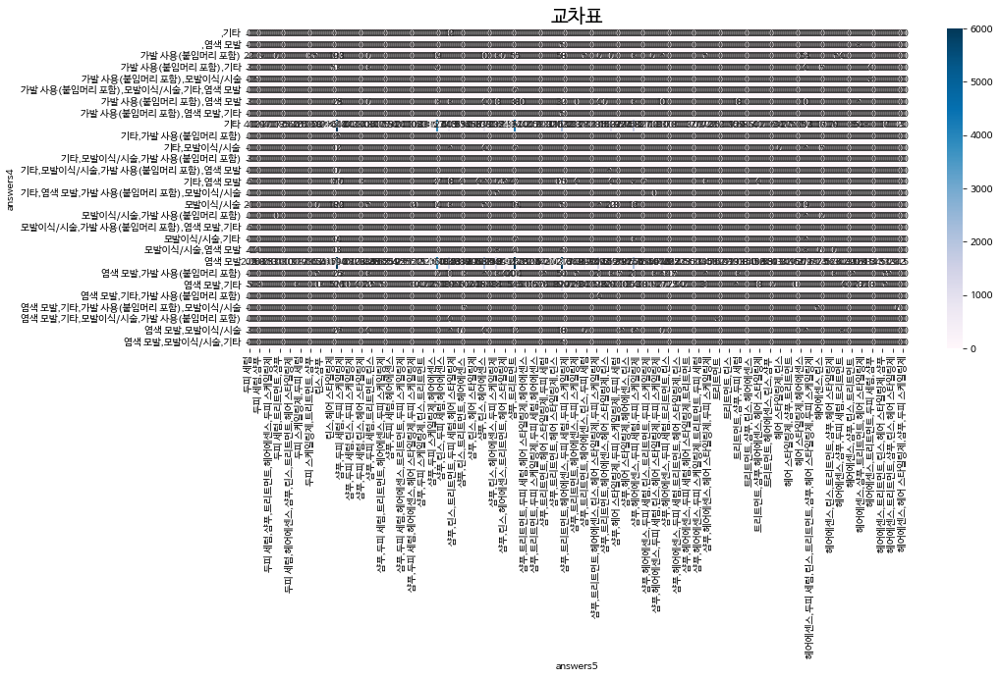

answers6                          아니오      예
answers4                                    
,기타                                 0     12
,염색 모발                              0     13
가발 사용(붙임머리 포함)                     88    439
가발 사용(붙임머리 포함),기타                  19     17
가발 사용(붙임머리 포함),모발이식/시술             15      0
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발     0      6
가발 사용(붙임머리 포함),염색 모발               16    189
가발 사용(붙임머리 포함),염색 모발,기타             0      5
기타                               7720  32944
기타,가발 사용(붙임머리 포함)                   6      0
기타,모발이식/시술                          7     34
기타,모발이식/시술,가발 사용(붙임머리 포함)           3      0
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발     7      6
기타,염색 모발                           57    264
기타,염색 모발,가발 사용(붙임머리 포함),모발이식/시술     0      6
모발이식/시술                            86    279
모발이식/시술,가발 사용(붙임머리 포함)              8      1
모발이식/시술,가발 사용(붙임머리 포함),염색 모발,기타     0      6
모발이식/시술,기타                          6     23
모발이식/시술,염색 모발                      16     40
염색 모발     

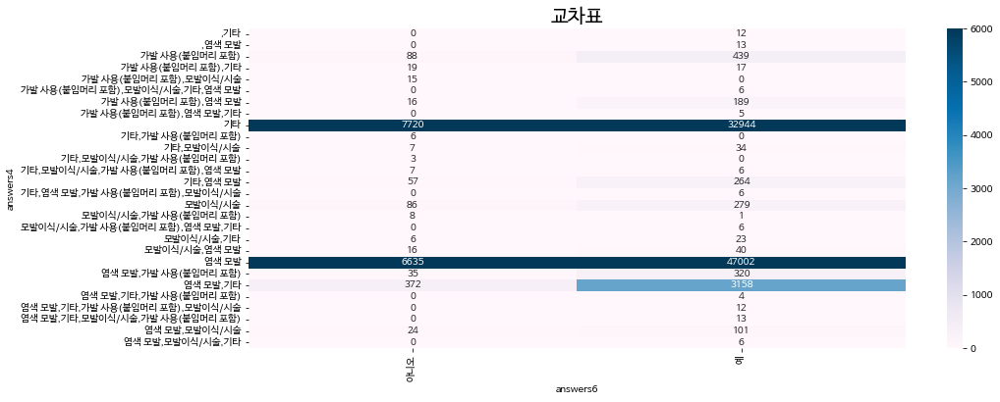

answers7                           가격   두피자극    머리결    세정력     향  헹굼후느낌
answers4                                                               
,기타                                 0      0     12      0     0      0
,염색 모발                              0      0      0     13     0      0
가발 사용(붙임머리 포함)                      0    142     84    221    50     30
가발 사용(붙임머리 포함),기타                   0      3     14      3     6     10
가발 사용(붙임머리 포함),모발이식/시술              0     15      0      0     0      0
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발     0      0      0      6     0      0
가발 사용(붙임머리 포함),염색 모발                0     40     21     75    61      8
가발 사용(붙임머리 포함),염색 모발,기타             0      5      0      0     0      0
기타                               1023   9683   6245  15661  4886   3166
기타,가발 사용(붙임머리 포함)                   0      6      0      0     0      0
기타,모발이식/시술                          0     17      5     11     2      6
기타,모발이식/시술,가발 사용(붙임머리 포함)           0      0      3      0     0

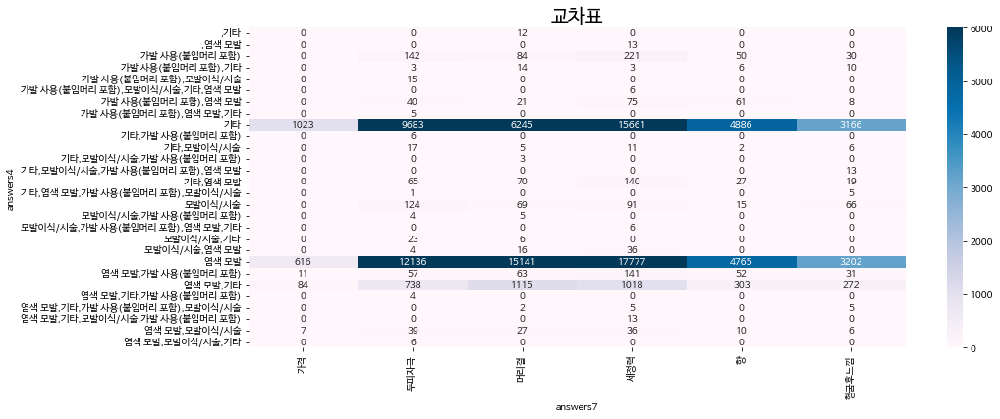

gender                                       남    여
answers5                                           
두피 세럼                                      117  209
두피 세럼,두피 스케일링제,샴푸                            9    0
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트    0    2
두피 세럼,린스                                     0   11
두피 세럼,린스,두피 스케일링제                            0    4
...                                        ...  ...
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸    0    2
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                      0    6
헤어에센스,헤어 스타일링제                               7    8
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                   0    3
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                      0    5

[322 rows x 2 columns]
1. 카이제곱 통계량: 34101.17601421143
2. p-value 0.0
3, df 321
4. 기대값 행렬:
              0           1
0    138.072505  187.927495
1      3.811818    5.188182
2      0.847071    1.152929
3      4.658888    6.341112
4      1.694141    2.305859
..          ...         ...
317    0.847071    1.152929
318    2.

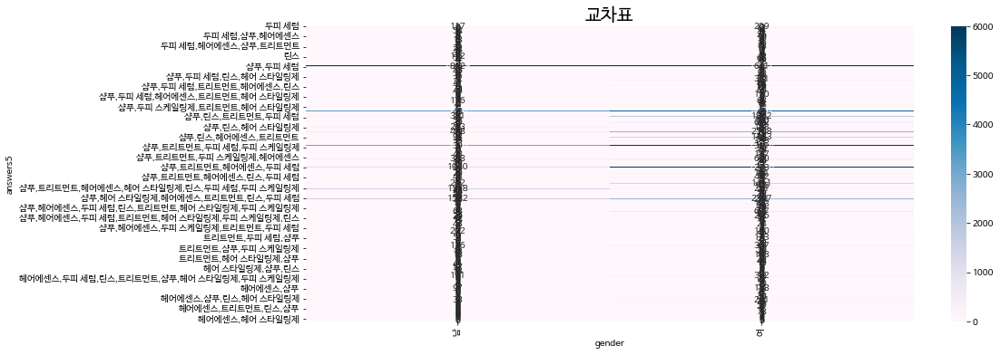

age                                        0대  10대  110대  20대  30대  40대  50대  \
answers5                                                                       
두피 세럼                                      12   19     0   51   70   95   58   
두피 세럼,두피 스케일링제,샴푸                           0    0     0    0    9    0    0   
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트   0    0     0    0    0    2    0   
두피 세럼,린스                                    0    0     0    0    0    6    5   
두피 세럼,린스,두피 스케일링제                           0    0     0    0    4    0    0   
...                                        ..  ...   ...  ...  ...  ...  ...   
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸   0    0     0    2    0    0    0   
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                     0    0     0    0    0    0    6   
헤어에센스,헤어 스타일링제                              0    0     0    3   12    0    0   
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                  0    0     0    0    0    3    0   
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                 

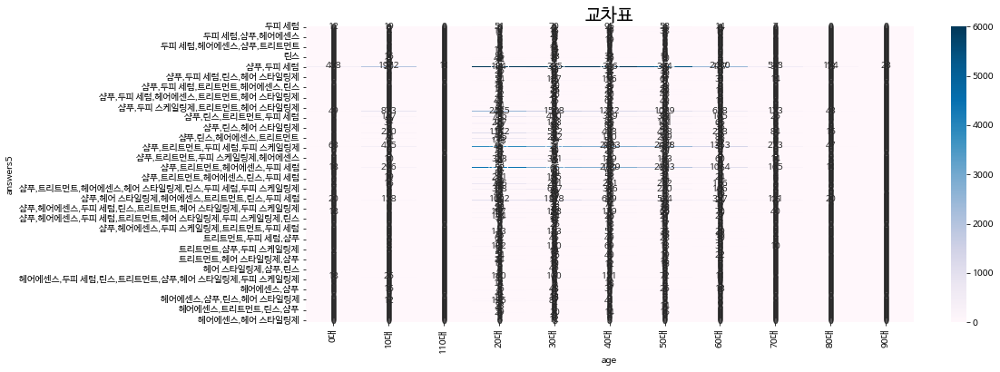

answers1                                   1일 1회  1일 2회  2일 1회
answers5                                                      
두피 세럼                                        258     64      4
두피 세럼,두피 스케일링제,샴푸                              9      0      0
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트      2      0      0
두피 세럼,린스                                       5      6      0
두피 세럼,린스,두피 스케일링제                              0      4      0
...                                          ...    ...    ...
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸      2      0      0
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                        2      4      0
헤어에센스,헤어 스타일링제                                 8      4      3
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                     3      0      0
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                        5      0      0

[322 rows x 3 columns]
1. 카이제곱 통계량: 7622.188398854963
2. p-value 0.0
3, df 642
4. 기대값 행렬:
              0          1          2
0    240.761528  55.369806  29.868666
1      6.64679

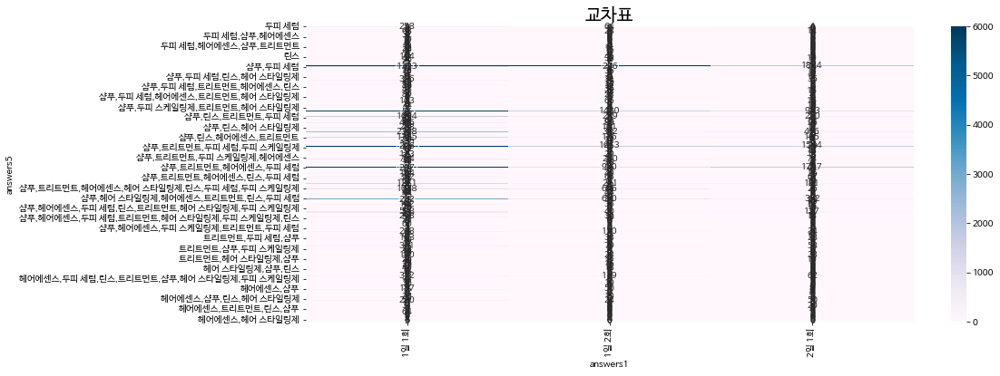

answers2                                   1~3회/연  4~6회/연  7회 이상/연  하지않음
answers5                                                                
두피 세럼                                         122      29        0   175
두피 세럼,두피 스케일링제,샴푸                               9       0        0     0
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트       2       0        0     0
두피 세럼,린스                                        0      11        0     0
두피 세럼,린스,두피 스케일링제                               0       4        0     0
...                                           ...     ...      ...   ...
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸       0       0        0     2
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                         2       0        0     4
헤어에센스,헤어 스타일링제                                 12       3        0     0
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                      3       0        0     0
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                         0       0        0     5

[322 rows x 4 columns]
1. 카이제곱 통계량: 10950.37114095

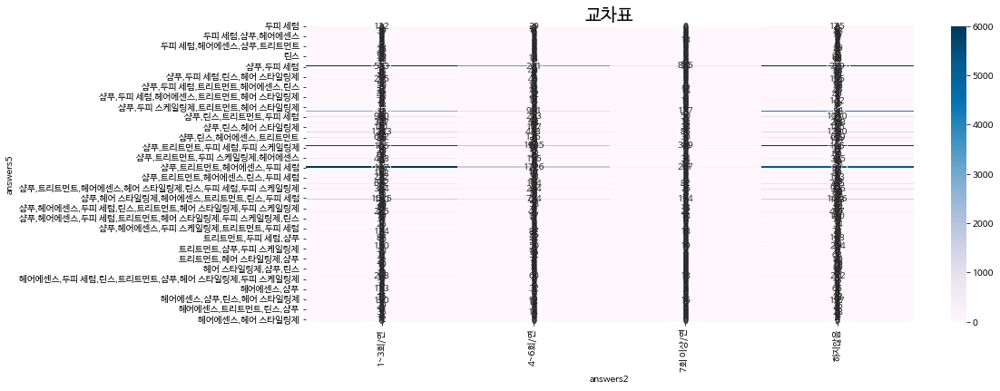

answers3                                   1~3회/연  4~6회/연  7회 이상/연  하지않음
answers5                                                                
두피 세럼                                         116      81       26   103
두피 세럼,두피 스케일링제,샴푸                               0       9        0     0
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트       0       0        2     0
두피 세럼,린스                                        5       6        0     0
두피 세럼,린스,두피 스케일링제                               4       0        0     0
...                                           ...     ...      ...   ...
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸       2       0        0     0
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                         0       4        0     2
헤어에센스,헤어 스타일링제                                  0      12        0     3
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                      0       3        0     0
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                         0       0        5     0

[322 rows x 4 columns]
1. 카이제곱 통계량: 24091.10347144

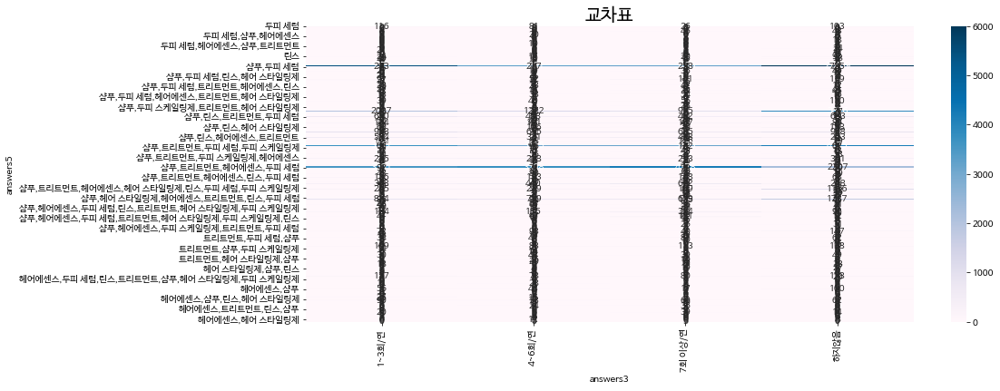

answers4                                   ,기타  ,염색 모발  가발 사용(붙임머리 포함)  \
answers5                                                                 
두피 세럼                                        0       0              22   
두피 세럼,두피 스케일링제,샴푸                            0       0               0   
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트    0       0               0   
두피 세럼,린스                                     0       0               0   
두피 세럼,린스,두피 스케일링제                            0       0               0   
...                                        ...     ...             ...   
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸    0       0               0   
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                      0       0               0   
헤어에센스,헤어 스타일링제                               0       0               0   
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                   0       0               0   
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                      0       0               0   

answers4                             

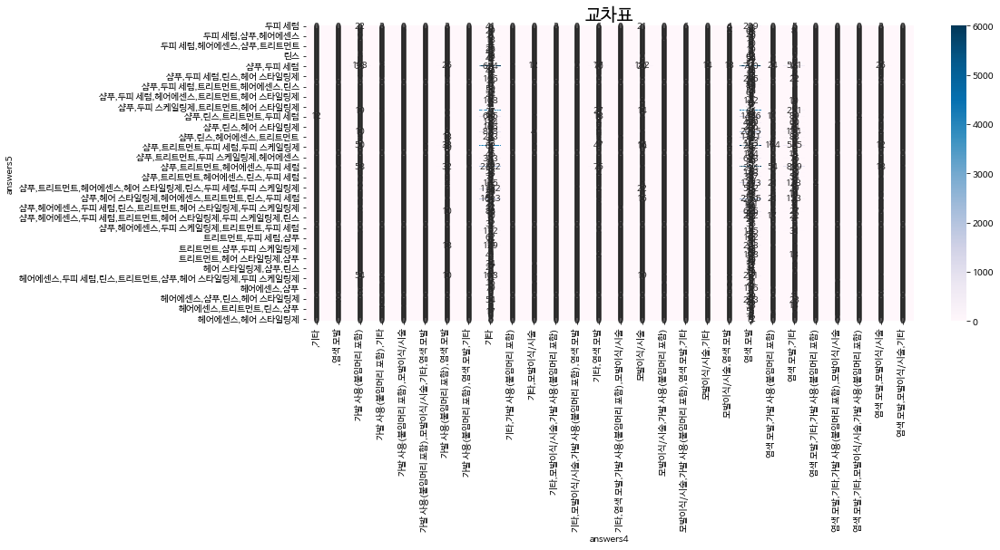

패스
answers6                                   아니오    예
answers5                                           
두피 세럼                                       51  275
두피 세럼,두피 스케일링제,샴푸                            0    9
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트    0    2
두피 세럼,린스                                    11    0
두피 세럼,린스,두피 스케일링제                            0    4
...                                        ...  ...
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸    0    2
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                      0    6
헤어에센스,헤어 스타일링제                               3   12
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                   0    3
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                      5    0

[322 rows x 2 columns]
1. 카이제곱 통계량: 3126.596937740049
2. p-value 0.0
3, df 321
4. 기대값 행렬:
             0           1
0    49.281344  276.718656
1     1.360528    7.639472
2     0.302340    1.697660
3     1.662867    9.337133
4     0.604679    3.395321
..         ...         ...
317   0.302340    1.697660
318   0.907019

<Figure size 1080x432 with 0 Axes>

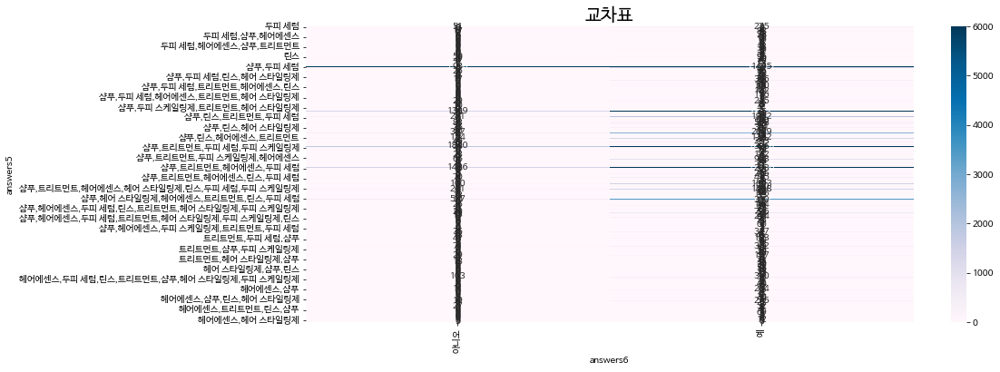

answers7                                   가격  두피자극  머리결  세정력   향  헹굼후느낌
answers5                                                                
두피 세럼                                       0   126   91   57  17     35
두피 세럼,두피 스케일링제,샴푸                           0     9    0    0   0      0
두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트   0     2    0    0   0      0
두피 세럼,린스                                    0    11    0    0   0      0
두피 세럼,린스,두피 스케일링제                           0     0    4    0   0      0
...                                        ..   ...  ...  ...  ..    ...
헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸   0     0    2    0   0      0
헤어에센스,트리트먼트,헤어 스타일링제,샴푸                     0     4    2    0   0      0
헤어에센스,헤어 스타일링제                              0     5    3    0   7      0
헤어에센스,헤어 스타일링제,샴푸,두피 스케일링제                  0     0    3    0   0      0
헤어에센스,헤어 스타일링제,트리트먼트,샴푸                     0     0    0    0   5      0

[322 rows x 6 columns]
1. 카이제곱 통계량: 21241.04612800

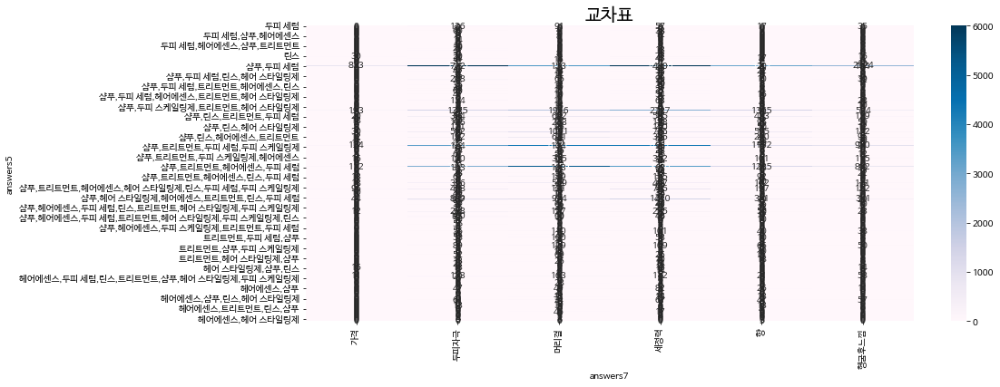

gender        남      여
answers6              
아니오        8150   6970
예         34212  50688
1. 카이제곱 통계량: 973.0302248454981
2. p-value 1.3079857645677967e-213
3, df 1
4. 기대값 행렬:
              0             1
0   6403.853629   8716.146371
1  35958.146371  48941.853629


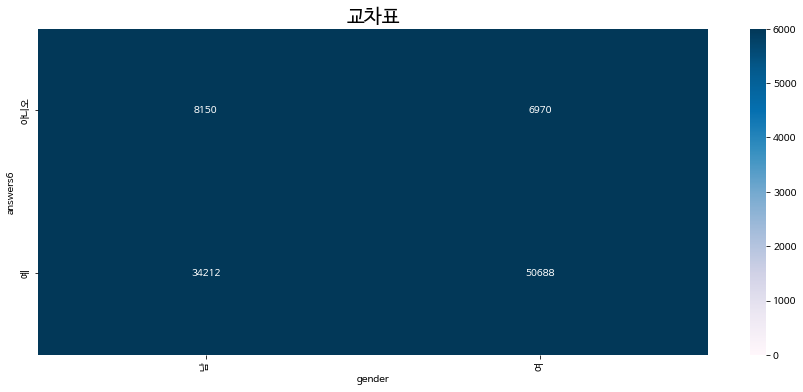

age        0대   10대  110대    20대    30대    40대    50대   60대   70대  80대  90대
answers6                                                                   
아니오        78   862     0   3731   4137   2938   2047  1037   246   40    4
예         666  3656    11  23433  19747  15732  13424  6505  1373  329   24
1. 카이제곱 통계량: 265.27395066025144
2. p-value 3.31234967790239e-51
3, df 10
4. 기대값 행렬:
           0            1         2             3             4   \
0  112.470306   682.985003  1.662867   4106.375525   3610.538692   
1  631.529694  3835.014997  9.337133  23057.624475  20273.461308   

             5             6            7            8           9          10  
0   2822.339532   2338.747451  1140.122376   244.743851   55.781644   4.232753  
1  15847.660468  13132.252549  6401.877624  1374.256149  313.218356  23.767247  


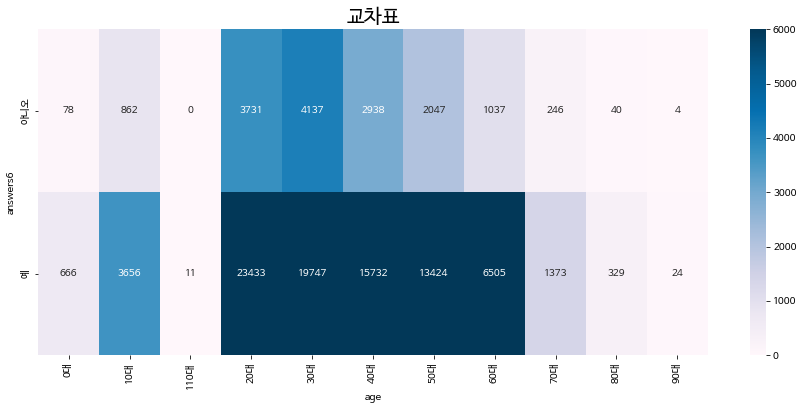

answers1  1일 1회  1일 2회  2일 1회
answers6                     
아니오       11029   2787   1304
예         62839  14201   7860
1. 카이제곱 통계량: 29.608901674711387
2. p-value 3.7197066721466536e-07
3, df 2
4. 기대값 행렬:
              0             1            2
0  11166.608278   2568.071986  1385.319736
1  62701.391722  14419.928014  7778.680264


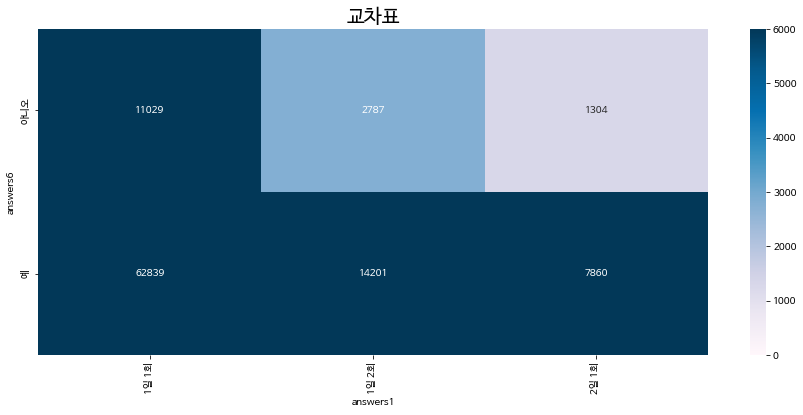

answers2  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers6                                
아니오         5229    1427      257   8207
예          29764   10613     2448  42075
1. 카이제곱 통계량: 224.22251463582398
2. p-value 2.4541627239782172e-48
3, df 3
4. 기대값 행렬:
              0             1            2             3
0   5289.883623   1820.083983   408.914217   7601.118176
1  29703.116377  10219.916017  2296.085783  42680.881824


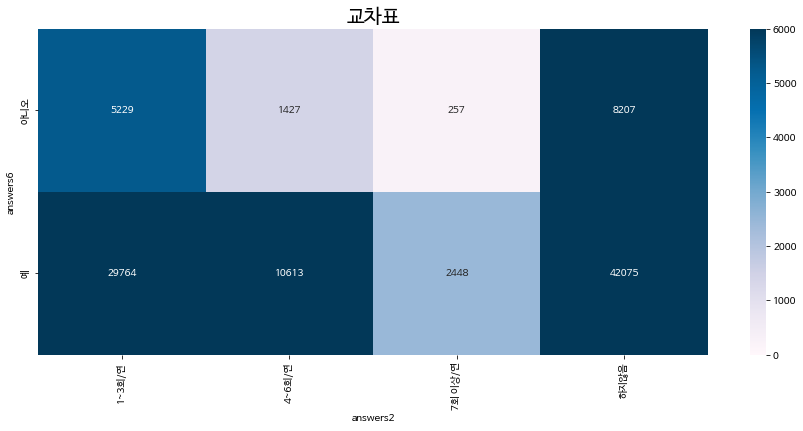

answers3  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers6                                
아니오         3159    2347     2002   7612
예          18611   15343    16914  34032
1. 카이제곱 통계량: 680.7873537965619
2. p-value 3.076003177490129e-147
3, df 3
4. 기대값 행렬:
              0             1             2             3
0   3290.965807   2674.193161   2859.527295   6295.313737
1  18479.034193  15015.806839  16056.472705  35348.686263


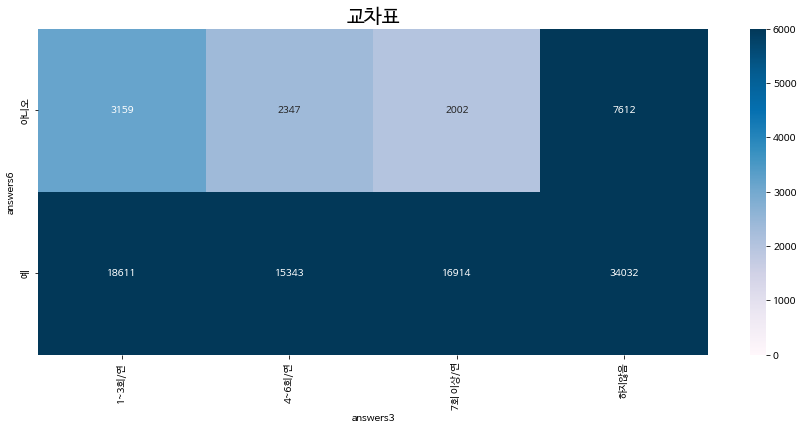

answers4  ,기타  ,염색 모발  가발 사용(붙임머리 포함)  가발 사용(붙임머리 포함),기타  \
answers6                                                   
아니오         0       0              88                 19   
예          12      13             439                 17   

answers4  가발 사용(붙임머리 포함),모발이식/시술  가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발  \
answers6                                                            
아니오                           15                                0   
예                              0                                6   

answers4  가발 사용(붙임머리 포함),염색 모발  가발 사용(붙임머리 포함),염색 모발,기타     기타  \
answers6                                                         
아니오                         16                        0   7720   
예                          189                        5  32944   

answers4  기타,가발 사용(붙임머리 포함)  ...  모발이식/시술,기타  모발이식/시술,염색 모발  염색 모발  \
answers6                     ...                                     
아니오                       6  ...           6             16   6635   
예      

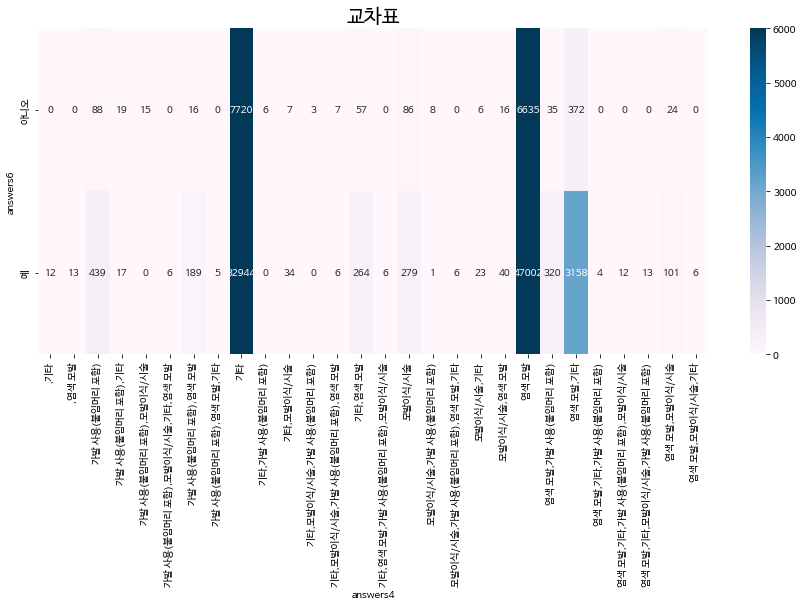

answers5  두피 세럼  두피 세럼,두피 스케일링제,샴푸  두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트  \
answers6                                                                        
아니오          51                  0                                          0   
예           275                  9                                          2   

answers5  두피 세럼,린스  두피 세럼,린스,두피 스케일링제  두피 세럼,샴푸  \
answers6                                          
아니오             11                  0        17   
예                0                  4        88   

answers5  두피 세럼,샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제  두피 세럼,샴푸,트리트먼트  \
answers6                                                              
아니오                                               0               0   
예                                                 9               6   

answers5  두피 세럼,샴푸,트리트먼트,헤어 스타일링제  두피 세럼,샴푸,트리트먼트,헤어에센스  ...  \
answers6                                                 ...   
아니오                             4                     4  

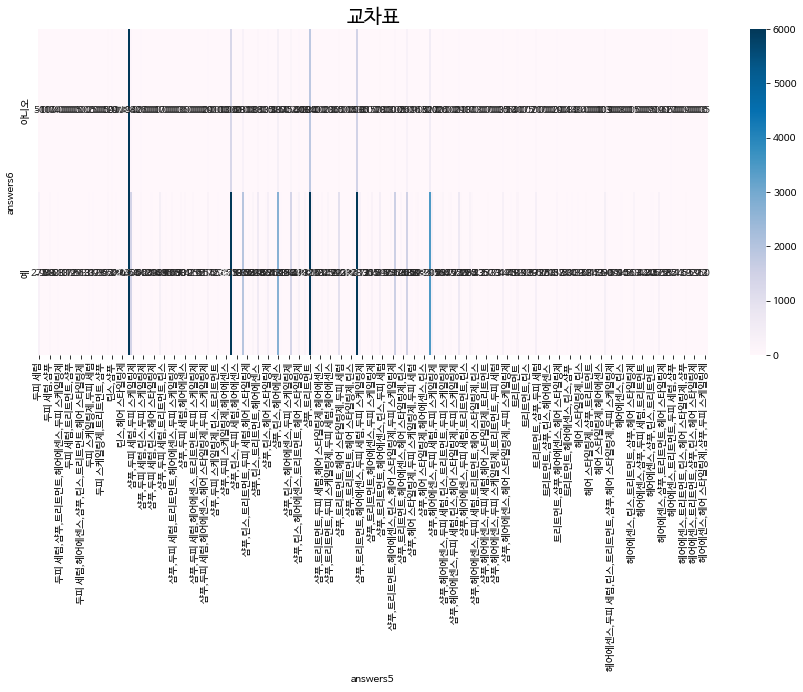

패스
answers7    가격   두피자극    머리결    세정력     향  헹굼후느낌
answers6                                        
아니오        499   2668   2839   5590  2254   1270
예         1242  20444  20059  29663  7923   5569
1. 카이제곱 통계량: 1081.4201503277795
2. p-value 1.411278649188494e-231
3, df 5
4. 기대값 행렬:
             0             1             2             3            4  \
0   263.186563   3493.835633   3461.485303   5329.187762  1538.454709   
1  1477.813437  19618.164367  19436.514697  29923.812238  8638.545291   

            5  
0  1033.85003  
1  5805.14997  


<Figure size 1080x432 with 0 Axes>

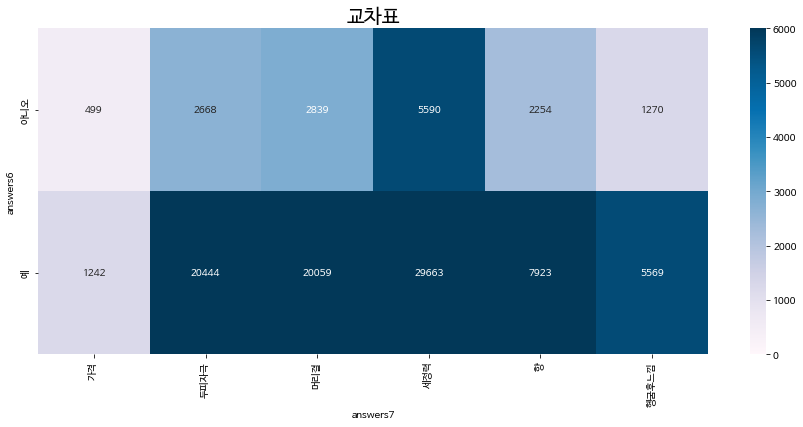

gender        남      여
answers7              
가격         1250    491
두피자극      10447  12665
머리결        5520  17378
세정력       17507  17746
향          4296   5881
헹굼후느낌      3342   3497
1. 카이제곱 통계량: 4707.424774537678
2. p-value 0.0
3, df 5
4. 기대값 행렬:
              0             1
0    737.374945   1003.625055
1   9788.747690  13323.252310
2   9698.111138  13199.888862
3  14930.889682  20322.110318
4   4310.318676   5866.681324
5   2896.557868   3942.442132


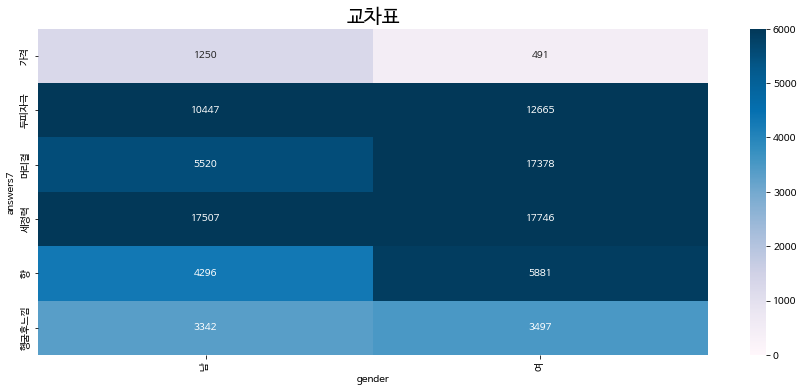

age        0대   10대  110대   20대   30대   40대   50대   60대  70대  80대  90대
answers7                                                              
가격          5    67     0   627   513   203   194   101   31    0    0
두피자극       99   525     0  4316  5863  5210  4373  2220  406   95    5
머리결        74   975     0  6555  4721  3954  3950  2124  450   88    7
세정력       506  1551    11  8350  8621  6998  5771  2615  644  175   11
향          37  1153     0  5214  2068   927   517   209   48    4    0
헹굼후느낌      23   247     0  2102  2098  1378   666   273   40    7    5
1. 카이제곱 통계량: 7964.564343531074
2. p-value 0.0
3, df 50
4. 기대값 행렬:
           0            1         2            3            4            5   \
0   12.950450    78.642651  0.191472   472.830674   415.737293   324.979704   
1  171.918896  1043.991362  2.541812  6276.888302  5518.966287  4314.147570   
2  170.327055  1034.324775  2.518276  6218.768966  5467.864747  4274.201760   
3  262.229874  1592.412058  3.877055  9574.210078 

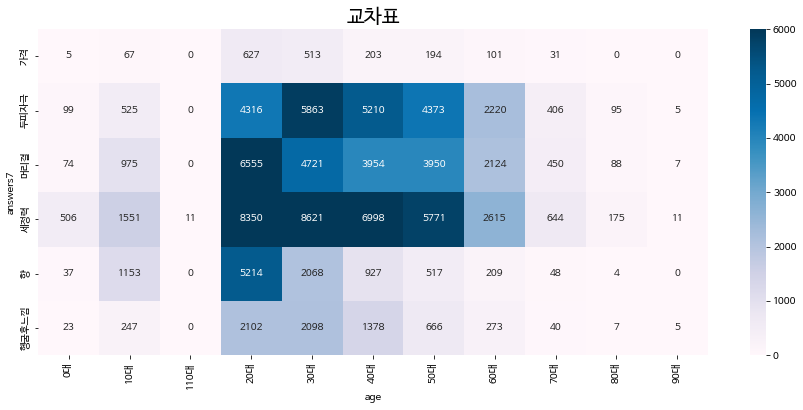

answers1  1일 1회  1일 2회  2일 1회
answers7                     
가격         1143    462    136
두피자극      16598   4198   2316
머리결       17350   2913   2635
세정력       26645   5810   2798
향          7301   2153    723
헹굼후느낌      4831   1452    556
1. 카이제곱 통계량: 882.1000279359355
2. p-value 4.5300235344422185e-183
3, df 10
4. 기대값 행렬:
              0            1            2
0   1285.784723   295.701940   159.513337
1  17068.958368  3925.481464  2117.560168
2  16910.912458  3889.134413  2097.953129
3  26035.478944  5987.582124  3229.938932
4   7516.043151  1728.523055   932.433793
5   5050.822356  1161.577005   626.600640


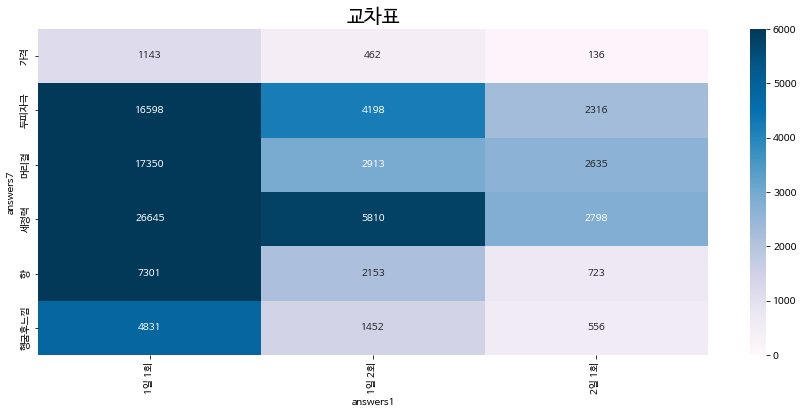

answers2  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers7                                
가격           520     143       52   1026
두피자극        8341    2959      745  11067
머리결         9562    3308      643   9385
세정력        10652    4078      863  19660
향           3386     835      210   5746
헹굼후느낌       2532     717      192   3398
1. 카이제곱 통계량: 1637.9534162881573
2. p-value 0.0
3, df 15
4. 기대값 행렬:
              0            1           2             3
0    609.106309   209.574485   47.084633    875.234573
1   8085.964967  2782.128374  625.054589  11618.852070
2   8011.094921  2756.367926  619.267047  11511.270106
3  12333.615567  4243.612478  953.402969  17722.368986
4   3560.525505  1225.065787  275.232803   5116.175905
5   2392.692731   823.250950  184.957958   3438.098360


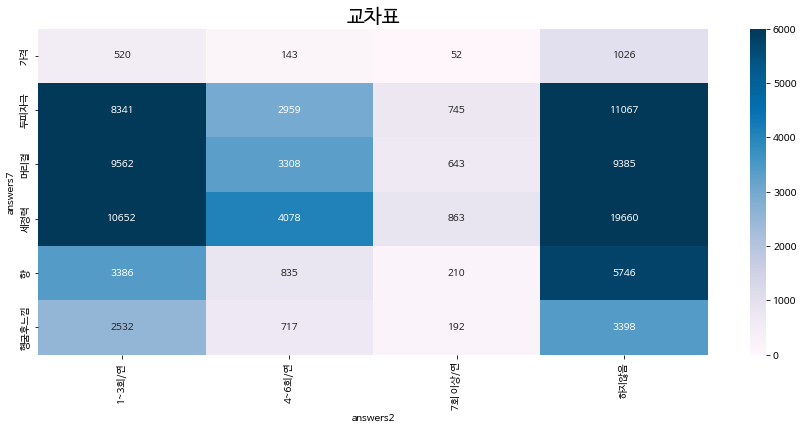

answers3  1~3회/연  4~6회/연  7회 이상/연   하지않음
answers7                                
가격           339     199      215    988
두피자극        4601    4142     4664   9705
머리결         5665    5049     5761   6423
세정력         6846    5947     5968  16492
향           2782    1332     1196   4867
헹굼후느낌       1537    1021     1112   3169
1. 카이제곱 통계량: 3191.678125414738
2. p-value 0.0
3, df 15
4. 기대값 행렬:
             0            1            2             3
0   378.939912   307.921316   329.261708    724.877065
1  5030.476305  4087.695261  4370.991722   9622.836713
2  4983.897820  4049.846231  4330.519576   9533.736373
3  7673.043491  6235.008698  6667.124055  14677.823755
4  2215.089882  1799.951310  1924.696381   4237.262428
5  1488.552589  1209.577185  1293.406559   2847.463667


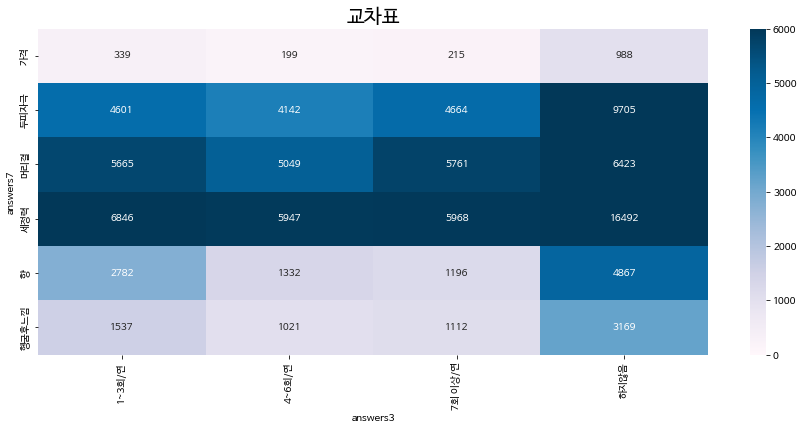

answers4  ,기타  ,염색 모발  가발 사용(붙임머리 포함)  가발 사용(붙임머리 포함),기타  \
answers7                                                   
가격          0       0               0                  0   
두피자극        0       0             142                  3   
머리결        12       0              84                 14   
세정력         0      13             221                  3   
향           0       0              50                  6   
헹굼후느낌       0       0              30                 10   

answers4  가발 사용(붙임머리 포함),모발이식/시술  가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발  \
answers7                                                            
가격                             0                                0   
두피자극                          15                                0   
머리결                            0                                0   
세정력                            0                                6   
향                              0                                0   
헹굼후느낌                          0    

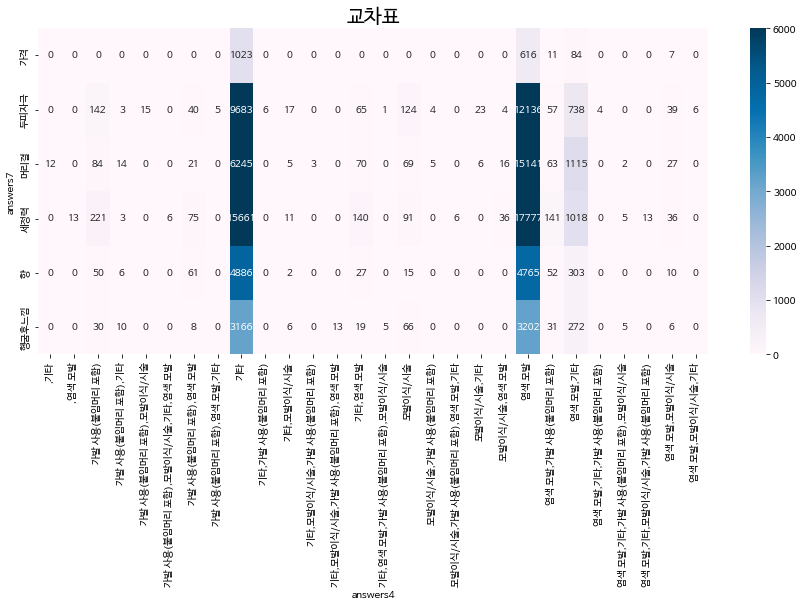

answers5  두피 세럼  두피 세럼,두피 스케일링제,샴푸  두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트  \
answers7                                                                        
가격            0                  0                                          0   
두피자극        126                  9                                          2   
머리결          91                  0                                          0   
세정력          57                  0                                          0   
향            17                  0                                          0   
헹굼후느낌        35                  0                                          0   

answers5  두피 세럼,린스  두피 세럼,린스,두피 스케일링제  두피 세럼,샴푸  \
answers7                                          
가격               0                  0         0   
두피자극            11                  0        60   
머리결              0                  4         0   
세정력              0                  0        38   
향                0                  0        

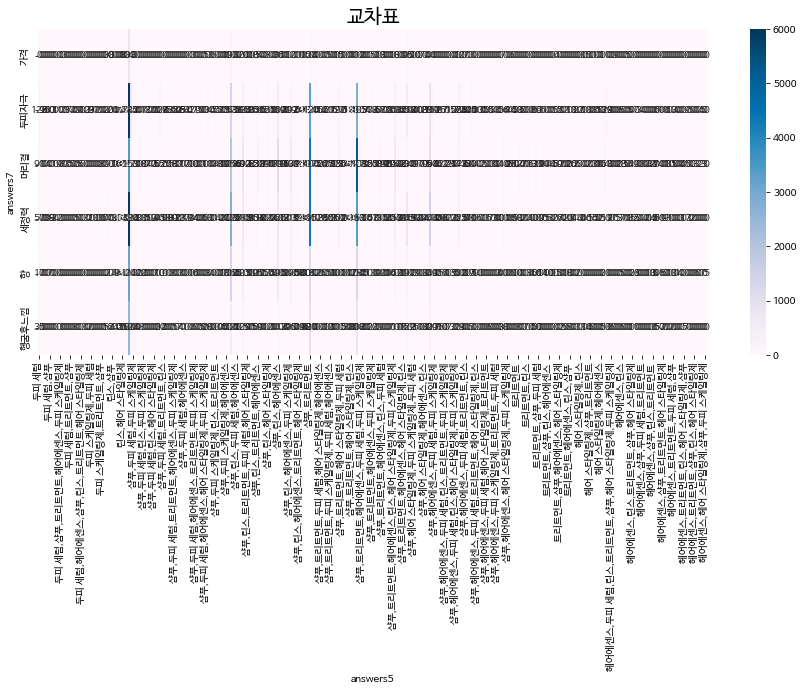

answers6   아니오      예
answers7             
가격         499   1242
두피자극      2668  20444
머리결       2839  20059
세정력       5590  29663
향         2254   7923
헹굼후느낌     1270   5569
1. 카이제곱 통계량: 1081.4201503277795
2. p-value 1.411278649188494e-231
3, df 5
4. 기대값 행렬:
             0             1
0   263.186563   1477.813437
1  3493.835633  19618.164367
2  3461.485303  19436.514697
3  5329.187762  29923.812238
4  1538.454709   8638.545291
5  1033.850030   5805.149970


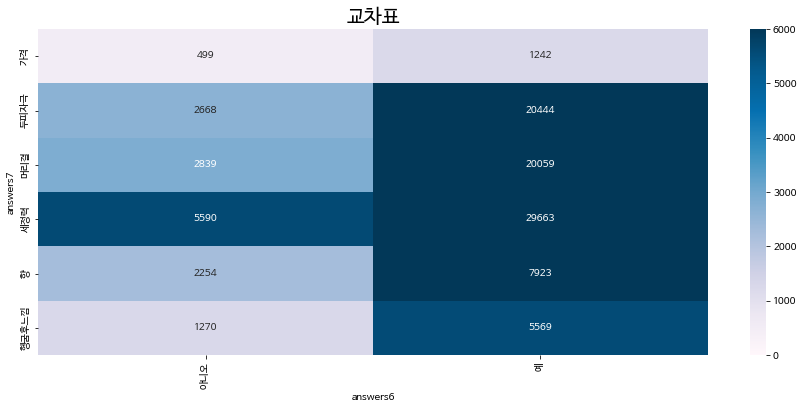

패스


<Figure size 1080x432 with 0 Axes>

In [75]:
columns = ['gender', 'age','answers1','answers2','answers3','answers4','answers5','answers6','answers7']

#for문으로 모든 변수간 카이제곱 검정
for i in range(9):
  for j in range(9):
    fig = plt.figure(figsize=(15,6))
    if i != j:
      p = scalp[columns[i]]
      t = scalp[columns[j]]

      ga = pd.crosstab(p,t,margins = False)
      print(ga)

      chi2, pvalue, dof, expected = scipy.stats.chi2_contingency(observed=ga, correction = False)
      print("1. 카이제곱 통계량:", chi2)
      print("2. p-value", pvalue)
      print("3, df", dof) #(행의개수 - 1)*(열의 개수-1)
      print("4. 기대값 행렬:")
      print(pd.DataFrame(expected))

      ax = sns.heatmap(ga, cmap = "PuBu", vmin = 0 , vmax = 6000, annot = True, fmt = '.0f')
      plt.xticks(rotation=90)
      plt.title("교차표", fontsize=20)
      plt.savefig("교차_"+columns[i]+"_"+columns[j]+".png")
      plt.show()
    else:
      print("패스")

In [76]:
# 모든 변수간 카이제곱 검정

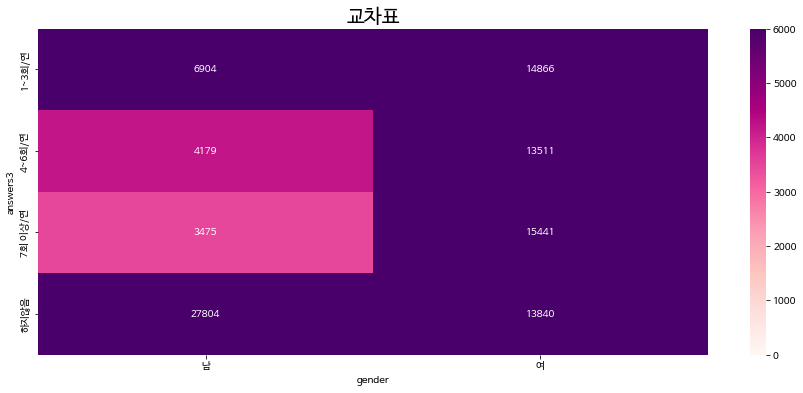

In [77]:
fig = plt.figure(figsize=(15,6))
data=pd.crosstab(tdf['answers3'],tdf['gender'], margins=False)
sns.heatmap(data, cmap="RdPu", vmin=0, vmax=6000, annot=True, fmt='.0f')
plt.title("교차표", fontsize=20)
plt.savefig("교차_"+columns[i]+"_"+columns[j]+".png")
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",rotation_mode="anchor")
plt.show()

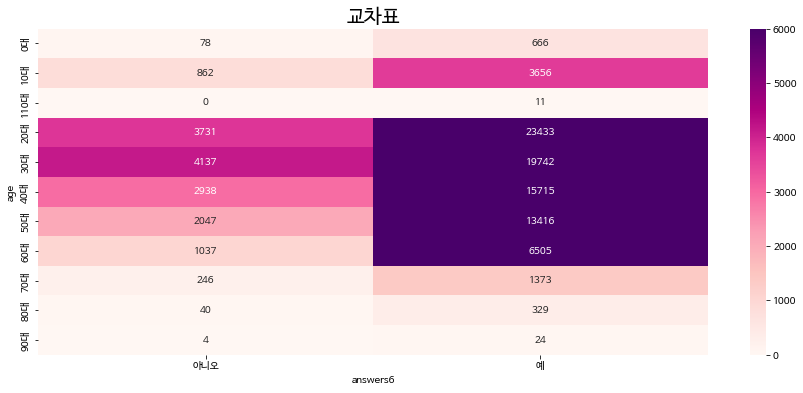

In [78]:
# age와 answer6
fig = plt.figure(figsize=(15,6))
data=pd.crosstab(tdf['age'],tdf['answers6'], margins=False)
sns.heatmap(data, cmap="RdPu", vmin=0, vmax=6000, annot=True, fmt='.0f')
plt.title("교차표", fontsize=20)
plt.savefig("교차_"+columns[i]+"_"+columns[j]+".png")
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",rotation_mode="anchor")
plt.show()

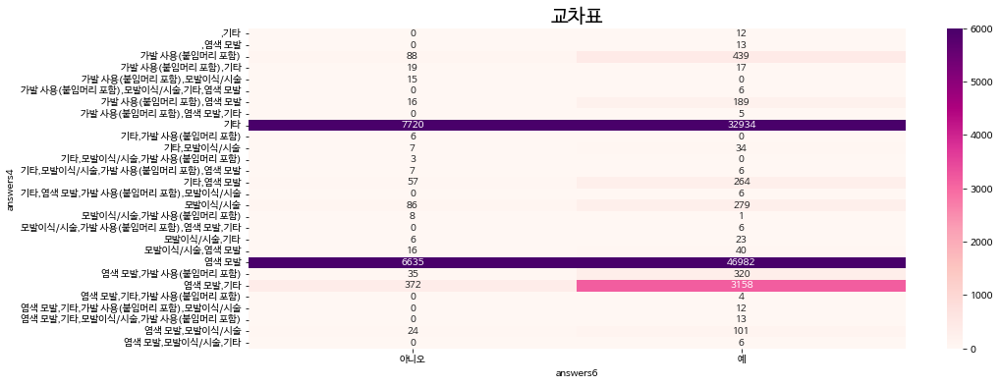

In [79]:
# answer4 vs answer6
fig = plt.figure(figsize=(15,6))
data=pd.crosstab(tdf['answers4'],tdf['answers6'], margins=False)
sns.heatmap(data, cmap="RdPu", vmin=0, vmax=6000, annot=True, fmt='.0f')
plt.title("교차표", fontsize=20)
plt.savefig("교차_"+columns[i]+"_"+columns[j]+".png")
plt.setp(ax.get_xticklabels(), rotation=45, ha="right",rotation_mode="anchor")
plt.show()

In [80]:
# 동질성 검사
ctab = pd.crosstab(index=tdf["answers4"], columns=tdf["answers6"])
print(ctab)

answers6                          아니오      예
answers4                                    
,기타                                 0     12
,염색 모발                              0     13
가발 사용(붙임머리 포함)                     88    439
가발 사용(붙임머리 포함),기타                  19     17
가발 사용(붙임머리 포함),모발이식/시술             15      0
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발     0      6
가발 사용(붙임머리 포함),염색 모발               16    189
가발 사용(붙임머리 포함),염색 모발,기타             0      5
기타                               7720  32934
기타,가발 사용(붙임머리 포함)                   6      0
기타,모발이식/시술                          7     34
기타,모발이식/시술,가발 사용(붙임머리 포함)           3      0
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발     7      6
기타,염색 모발                           57    264
기타,염색 모발,가발 사용(붙임머리 포함),모발이식/시술     0      6
모발이식/시술                            86    279
모발이식/시술,가발 사용(붙임머리 포함)              8      1
모발이식/시술,가발 사용(붙임머리 포함),염색 모발,기타     0      6
모발이식/시술,기타                          6     23
모발이식/시술,염색 모발                      16     40
염색 모발     

In [81]:
from scipy import stats
chi2, p, dof, expected = stats.chi2_contingency(ctab)
msg = "chi2:{}, p-value:{}, df:{}"
print(msg.format(chi2, p, dof))

chi2:1139.015522613904, p-value:7.69404389077491e-223, df:27


In [83]:
# answer5 정리
#300미만 삭제
scalp['answers5'].value_counts()[:20]

샴푸                         34365
샴푸,트리트먼트                   14140
샴푸,트리트먼트,헤어에센스             13594
샴푸,린스                       8120
샴푸,헤어에센스                    3979
샴푸,린스,헤어에센스                 3086
샴푸,린스,트리트먼트                 2243
샴푸,헤어 스타일링제                 1749
샴푸,트리트먼트,헤어에센스,헤어 스타일링제     1663
샴푸,린스,헤어에센스,트리트먼트           1536
샴푸,두피 세럼                    1503
샴푸,트리트먼트,헤어 스타일링제           1058
샴푸,헤어에센스,두피 세럼,트리트먼트         755
샴푸,린스,트리트먼트,헤어에센스            671
헤어에센스                        493
샴푸,트리트먼트,헤어에센스,린스            485
트리트먼트,샴푸                     443
샴푸,두피 세럼,트리트먼트               403
샴푸,린스,헤어 스타일링제               396
샴푸,헤어에센스,헤어 스타일링제            352
Name: answers5, dtype: int64

In [84]:
#others는 100개 미만 제품들 합
a=['샴푸','샴푸,트리트먼트','샴푸,트리트먼트,헤어에센스','샴푸,린스','other','샴푸,헤어에센스','샴푸,린스,헤어에센스','샴푸,린스,트리트먼트','샴푸,헤어 스타일링제','샴푸,트리트먼트,헤어에센스,헤어 스타일링제','샴푸,린스,헤어에센스,트리트먼트','샴푸,두피 세럼','샴푸,트리트먼트,헤어 스타일링제','샴푸,헤어에센스,두피 세럼, 트리트먼트','샴푸,린스,트리트먼트','헤어에센스','헤어에센스','샴푸,트리트먼트,헤어에센스,린스','트리트먼트,샴푸','샴푸,두피,세럼,트리트먼트','샴푸,린스,헤어 스타일링제','샴푸,트리트먼트,두피 세럼','두피 세럼','샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제','샴푸,헤어에센스,두피 세럼','샴푸,트리트먼트,헤어에센스,두피 세럼']
b=[34365,14140,13594,8120,4085,3979,3086,2243,1749,1663,1536,1503,1058,755,671,493,485,443,403,396,352,350,326,323,319,301]

da = pd.DataFrame({"현재 사용 두피 제품":a, "응답수":b})
da

,현재 사용 두피 제품,응답수
0,샴푸,34365
1,"샴푸,트리트먼트",14140
2,"샴푸,트리트먼트,헤어에센스",13594
3,"샴푸,린스",8120
4,other,4085
5,"샴푸,헤어에센스",3979
6,"샴푸,린스,헤어에센스",3086
7,"샴푸,린스,트리트먼트",2243
8,"샴푸,헤어 스타일링제",1749
9,"샴푸,트리트먼트,헤어에센스,헤어 스타일링제",1663


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]),
 [Text(0, 0, '샴푸'),
  Text(1, 0, '샴푸,트리트먼트'),
  Text(2, 0, '샴푸,트리트먼트,헤어에센스'),
  Text(3, 0, '샴푸,린스'),
  Text(4, 0, 'other'),
  Text(5, 0, '샴푸,헤어에센스'),
  Text(6, 0, '샴푸,린스,헤어에센스'),
  Text(7, 0, '샴푸,린스,트리트먼트'),
  Text(8, 0, '샴푸,헤어 스타일링제'),
  Text(9, 0, '샴푸,트리트먼트,헤어에센스,헤어 스타일링제'),
  Text(10, 0, '샴푸,린스,헤어에센스,트리트먼트'),
  Text(11, 0, '샴푸,두피 세럼'),
  Text(12, 0, '샴푸,트리트먼트,헤어 스타일링제'),
  Text(13, 0, '샴푸,헤어에센스,두피 세럼, 트리트먼트'),
  Text(14, 0, '헤어에센스'),
  Text(15, 0, '샴푸,트리트먼트,헤어에센스,린스'),
  Text(16, 0, '트리트먼트,샴푸'),
  Text(17, 0, '샴푸,두피,세럼,트리트먼트'),
  Text(18, 0, '샴푸,린스,헤어 스타일링제'),
  Text(19, 0, '샴푸,트리트먼트,두피 세럼'),
  Text(20, 0, '두피 세럼'),
  Text(21, 0, '샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제'),
  Text(22, 0, '샴푸,헤어에센스,두피 세럼'),
  Text(23, 0, '샴푸,트리트먼트,헤어에센스,두피 세럼')])

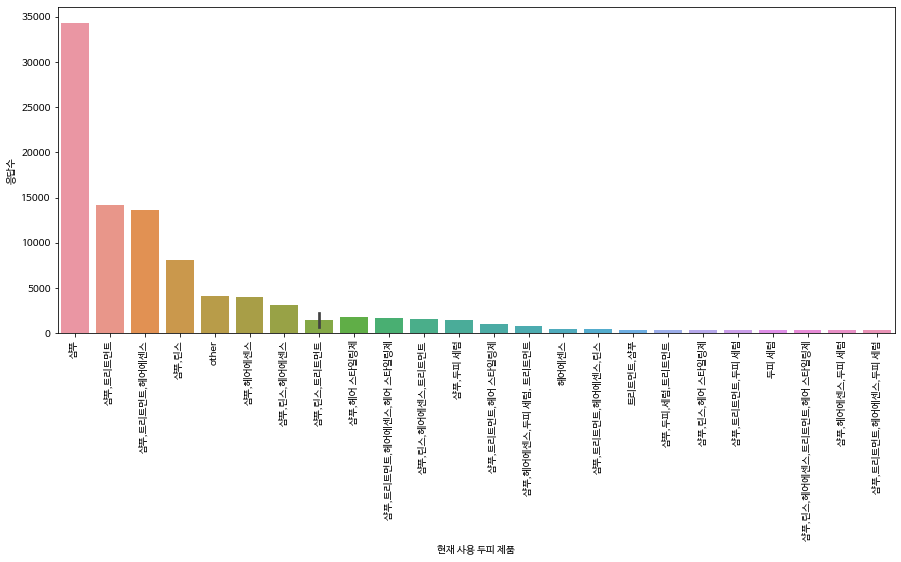

In [85]:
fig = plt.figure(figsize=(15,6))
sns.barplot(x='현재 사용 두피 제품', y='응답수', data=da)
plt.xticks(rotation=90)
# plt.setp(ax.get_xticklabels(), rotation=15, ha="right",rotation_mode="anchor")

In [86]:
# 범주형data 통계분석

In [87]:
manu_count = scalp['answers5'].value_counts()
manu_count.sort_values(ascending = False, inplace=True)
manu_count

샴푸                                           34365
샴푸,트리트먼트                                     14140
샴푸,트리트먼트,헤어에센스                               13594
샴푸,린스                                         8120
샴푸,헤어에센스                                      3979
                                             ...  
헤어 스타일링제,샴푸,린스                                   2
헤어에센스,트리트먼트,린스                                   1
샴푸,린스,헤어 스타일링제,두피 세럼                             1
샴푸,두피 세럼,두피 스케일링제,헤어에센스,린스,트리트먼트,헤어 스타일링제        1
샴푸,두피 세럼,헤어에센스,헤어 스타일링제                          1
Name: answers5, Length: 322, dtype: int64

In [88]:
#100 이상인 제품들
scalp['answers5'].value_counts()[:44]

샴푸                                  34365
샴푸,트리트먼트                            14140
샴푸,트리트먼트,헤어에센스                      13594
샴푸,린스                                8120
샴푸,헤어에센스                             3979
샴푸,린스,헤어에센스                          3086
샴푸,린스,트리트먼트                          2243
샴푸,헤어 스타일링제                          1749
샴푸,트리트먼트,헤어에센스,헤어 스타일링제              1663
샴푸,린스,헤어에센스,트리트먼트                    1536
샴푸,두피 세럼                             1503
샴푸,트리트먼트,헤어 스타일링제                    1058
샴푸,헤어에센스,두피 세럼,트리트먼트                  755
샴푸,린스,트리트먼트,헤어에센스                     671
헤어에센스                                 493
샴푸,트리트먼트,헤어에센스,린스                     485
트리트먼트,샴푸                              443
샴푸,두피 세럼,트리트먼트                        403
샴푸,린스,헤어 스타일링제                        396
샴푸,헤어에센스,헤어 스타일링제                     352
샴푸,트리트먼트,두피 세럼                        350
두피 세럼                                 326
샴푸,린스,헤어에센스,트리트먼트,헤어 스타일링제            323
샴푸,헤어에센스,두피 세럼                    

In [89]:
manu_idx = manu_count.index[44:]
manu_idx

Index(['린스,샴푸', '샴푸,린스,두피 세럼', '샴푸,트리트먼트,헤어 스타일링제,헤어에센스', '샴푸,두피 세럼,헤어 스타일링제',
       '샴푸,헤어에센스,두피 세럼,트리트먼트,헤어 스타일링제,두피 스케일링제', '헤어에센스,트리트먼트,샴푸',
       '샴푸,트리트먼트,헤어에센스,린스,헤어 스타일링제',
       '샴푸,헤어에센스,두피 세럼,린스,트리트먼트,헤어 스타일링제,두피 스케일링제', '샴푸,트리트먼트,두피 세럼,헤어에센스',
       '샴푸,헤어에센스,두피 스케일링제',
       ...
       '헤어에센스,샴푸,두피 세럼,트리트먼트,린스', '샴푸,트리트먼트,두피 세럼,헤어에센스,린스', '린스,두피 스케일링제',
       '헤어에센스,트리트먼트,헤어 스타일링제,두피 스케일링제,린스,두피 세럼,샴푸',
       '두피 세럼,두피 스케일링제,헤어 스타일링제,린스,헤어에센스,샴푸,트리트먼트', '헤어 스타일링제,샴푸,린스',
       '헤어에센스,트리트먼트,린스', '샴푸,린스,헤어 스타일링제,두피 세럼',
       '샴푸,두피 세럼,두피 스케일링제,헤어에센스,린스,트리트먼트,헤어 스타일링제', '샴푸,두피 세럼,헤어에센스,헤어 스타일링제'],
      dtype='object', length=278)

In [90]:
# tdf['answers5'].fillna('other', inplace=True) # df['manufacturer']에 있는 NaN 값을 'others'로 변경
# df['manufacturer']의 컬럼의 값이 manu_idx에 있는 데이터는 'others'로 변경
for num in range(len(scalp['answers5'])):
  if str(scalp.iloc[num]['answers5']) in manu_idx:
    scalp.at[num,'answers5'] = 'other'

In [91]:
scalp.head()

,gender,age,location,question1,answers1,question2,answers2,question3,answers3,question4,answers4,question5,answers5,question6,answers6,question7,answers7
0,남,50대,TH,샴푸 사용 빈도,1일 2회,펌 주기,하지않음,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
1,여,60대,TH,샴푸 사용 빈도,1일 1회,펌 주기,4~6회/연,염색 주기 (자가 염색 포함),4~6회/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
2,남,0대,BH,샴푸 사용 빈도,1일 1회,펌 주기,하지않음,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,샴푸,맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
3,여,50대,RH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),4~6회/연,현재 모발 상태,염색 모발,현재 사용하고 있는 두피모발용 제품,"샴푸,린스,헤어에센스",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,세정력
4,남,20대,LH,샴푸 사용 빈도,1일 1회,펌 주기,1~3회/연,염색 주기 (자가 염색 포함),하지않음,현재 모발 상태,기타,현재 사용하고 있는 두피모발용 제품,"샴푸,트리트먼트,두피 세럼",맞춤두피케어 제품사용을 희망(선호)하시나요,예,샴푸 구매시 중요시 고려하는 부분은 무엇인가요?,두피자극


In [92]:
# answer4정리
#300미만 삭제
scalp['answers4'].value_counts()[:5]

염색 모발             53637
기타                40664
염색 모발,기타           3530
가발 사용(붙임머리 포함)      527
모발이식/시술             365
Name: answers4, dtype: int64

In [93]:
#others는 300개 미만 제품들 합
a=['염색 모발','기타','염색 모발,기타','가발 사용(붙임머리 포함)','모발이식/시술','염색 모발,가발 사용(붙임머리 포함)','기타,염색 모발','가발 사용(붙임머리 포함),염색 모발','염색 모발,모발이식/시술']
b=[53637,40664,3530,527,365,355,321,205,125]

da = pd.DataFrame({"현재 모발 상태":a, "응답수":b})
da

,현재 모발 상태,응답수
0,염색 모발,53637
1,기타,40664
2,"염색 모발,기타",3530
3,가발 사용(붙임머리 포함),527
4,모발이식/시술,365
5,"염색 모발,가발 사용(붙임머리 포함)",355
6,"기타,염색 모발",321
7,"가발 사용(붙임머리 포함),염색 모발",205
8,"염색 모발,모발이식/시술",125


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, '염색 모발'),
  Text(1, 0, '기타'),
  Text(2, 0, '염색 모발,기타'),
  Text(3, 0, '가발 사용(붙임머리 포함)'),
  Text(4, 0, '모발이식/시술'),
  Text(5, 0, '염색 모발,가발 사용(붙임머리 포함)'),
  Text(6, 0, '기타,염색 모발'),
  Text(7, 0, '가발 사용(붙임머리 포함),염색 모발'),
  Text(8, 0, '염색 모발,모발이식/시술')])

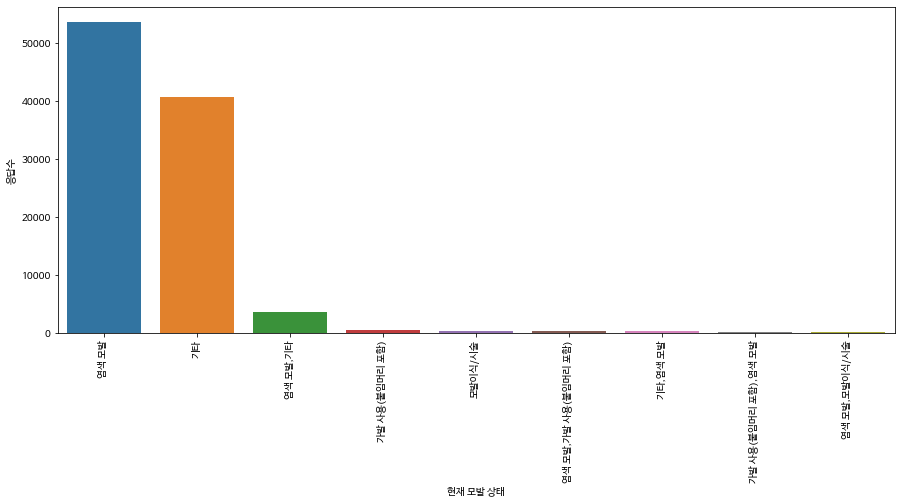

In [94]:
import seaborn as sns
fig = plt.figure(figsize=(15,6))
sns.barplot(x='현재 모발 상태', y='응답수', data=da)
plt.xticks(rotation=90)
# plt.setp(ax.get_xticklabels(), rotation=15, ha="right",rotation_mode="anchor")

In [95]:
nunu_count = scalp['answers4'].value_counts()
nunu_count.sort_values(ascending = False, inplace=True)
nunu_count

염색 모발                              53637
기타                                 40664
염색 모발,기타                            3530
가발 사용(붙임머리 포함)                       527
모발이식/시술                              365
염색 모발,가발 사용(붙임머리 포함)                 355
기타,염색 모발                             321
가발 사용(붙임머리 포함),염색 모발                 205
염색 모발,모발이식/시술                        125
모발이식/시술,염색 모발                         56
기타,모발이식/시술                            41
가발 사용(붙임머리 포함),기타                     36
모발이식/시술,기타                            29
가발 사용(붙임머리 포함),모발이식/시술                15
기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발       13
,염색 모발                                13
염색 모발,기타,모발이식/시술,가발 사용(붙임머리 포함)       13
염색 모발,기타,가발 사용(붙임머리 포함),모발이식/시술       12
,기타                                   12
모발이식/시술,가발 사용(붙임머리 포함)                 9
가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발        6
모발이식/시술,가발 사용(붙임머리 포함),염색 모발,기타        6
기타,염색 모발,가발 사용(붙임머리 포함),모발이식/시술        6
기타,가발 사용(붙임머리 포함)                      6
염색 모발,모발이식/시술,기타

In [96]:
nunu_idx = nunu_count.index[5:]
nunu_idx

Index(['염색 모발,가발 사용(붙임머리 포함)', '기타,염색 모발', '가발 사용(붙임머리 포함),염색 모발',
       '염색 모발,모발이식/시술', '모발이식/시술,염색 모발', '기타,모발이식/시술', '가발 사용(붙임머리 포함),기타',
       '모발이식/시술,기타', '가발 사용(붙임머리 포함),모발이식/시술',
       '기타,모발이식/시술,가발 사용(붙임머리 포함),염색 모발', ',염색 모발',
       '염색 모발,기타,모발이식/시술,가발 사용(붙임머리 포함)', '염색 모발,기타,가발 사용(붙임머리 포함),모발이식/시술',
       ',기타', '모발이식/시술,가발 사용(붙임머리 포함)', '가발 사용(붙임머리 포함),모발이식/시술,기타,염색 모발',
       '모발이식/시술,가발 사용(붙임머리 포함),염색 모발,기타', '기타,염색 모발,가발 사용(붙임머리 포함),모발이식/시술',
       '기타,가발 사용(붙임머리 포함)', '염색 모발,모발이식/시술,기타', '가발 사용(붙임머리 포함),염색 모발,기타',
       '염색 모발,기타,가발 사용(붙임머리 포함)', '기타,모발이식/시술,가발 사용(붙임머리 포함)'],
      dtype='object')

In [97]:
for num in range(len(scalp['answers4'])):
  if str(scalp.iloc[num]['answers4']) in nunu_idx:
    scalp.at[num,'answers4'] = 'other'

In [98]:
scalp['answers4'].value_counts()

염색 모발             53637
기타                40664
염색 모발,기타           3530
other              1297
가발 사용(붙임머리 포함)      527
모발이식/시술             365
Name: answers4, dtype: int64

([<matplotlib.patches.Wedge at 0x7f746515aac0>,
 [Text(-1.0928695955127905, -0.12504418100699416, '염색 모발'),
  Text(1.097626138429537, -0.0722278356055569, '기타'),
  Text(0.27042530965331496, 1.0662411321548746, '염색 모발,기타'),
  Text(0.10628429617843706, 1.094853254270112, 'other'),
  Text(0.04341877567015127, 1.099142761391488, '가발 사용(붙임머리 포함)'),
  Text(0.012610638184779475, 1.099927712081377, '모발이식/시술')],
 [Text(-0.596110688461522, -0.0682059169129059, '53.6%'),
  Text(0.5987051664161109, -0.039397001239394665, '40.7%'),
  Text(0.1475047143563536, 0.581586072084477, '3.5%'),
  Text(0.05797325246096566, 0.5971926841473337, '1.3%'),
  Text(0.023682968547355233, 0.5995324153044479, '0.5%'),
  Text(0.006878529918970622, 0.5999605702262056, '0.4%')])

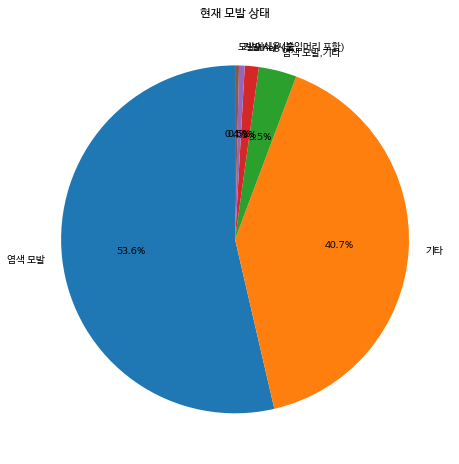

In [99]:
fig = plt.figure(figsize=(20,8))
import matplotlib.pyplot as plt
name = ['염색 모발','기타','염색 모발,기타','other','가발 사용(붙임머리 포함)','모발이식/시술']
plt.title('현재 모발 상태')
plt.pie(x = scalp['answers4'].value_counts(), data = scalp,labels = name, startangle=90, autopct='%.1f%%')